<a href="https://colab.research.google.com/github/PaSathees/random-notebooks/blob/main/TF_DEV_DA_Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Course 1

## Week 1

### Lab 1

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow import keras

print(tf.__version__)

2.12.0


In [ ]:
model = tf.keras.Sequential([
    keras.layers.Dense(units=1, input_shape=[1])
])

In [ ]:
model.compile(optimizer='sgd', loss='mean_squared_error')

In [ ]:
xs = np.array([-1.0,  0.0, 1.0, 2.0, 3.0, 4.0], dtype=float)
ys = np.array([-3.0, -1.0, 1.0, 3.0, 5.0, 7.0], dtype=float)

In [ ]:
model.fit(xs, ys, epochs=500)

Epoch 1/500
1/1 [==============================] - 0s 492ms/step - loss: 8.6780
Epoch 2/500
1/1 [==============================] - 0s 12ms/step - loss: 7.0296
Epoch 3/500
1/1 [==============================] - 0s 9ms/step - loss: 5.7285
Epoch 4/500
1/1 [==============================] - 0s 9ms/step - loss: 4.7008
Epoch 5/500
1/1 [==============================] - 0s 11ms/step - loss: 3.8883
Epoch 6/500
1/1 [==============================] - 0s 10ms/step - loss: 3.2452
Epoch 7/500
1/1 [==============================] - 0s 8ms/step - loss: 2.7354
Epoch 8/500
1/1 [==============================] - 0s 7ms/step - loss: 2.3305
Epoch 9/500
1/1 [==============================] - 0s 7ms/step - loss: 2.0083
Epoch 10/500
1/1 [==============================] - 0s 8ms/step - loss: 1.7513
Epoch 11/500
1/1 [==============================] - 0s 8ms/step - loss: 1.5455
Epoch 12/500
1/1 [==============================] - 0s 7ms/step - loss: 1.3802
Epoch 13/500
1/1 [==============================] - 0s 1

In [ ]:
model.predict([10.0])

1/1 [==============================] - 0s 127ms/step


array([[18.983154]], dtype=float32)

### Week 1 Assignment

In [ ]:
import tensorflow as tf
import numpy as np

In [ ]:
def house_model():
  xs = np.array([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], dtype=float)
  ys = np.array([1.0, 1.5, 2.0, 2.5, 3.0, 3.5], dtype=float)

  model = tf.keras.Sequential([
      tf.keras.layers.Dense(units=1, input_shape=[1])
  ])

  model.compile(optimizer="sgd", loss="mean_squared_error")

  model.fit(xs, ys, epochs=1000)

  return model

In [ ]:
model = house_model()

Epoch 1/1000
1/1 [==============================] - 0s 266ms/step - loss: 4.3299
Epoch 2/1000
1/1 [==============================] - 0s 8ms/step - loss: 2.0189
Epoch 3/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.9492
Epoch 4/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.4540
Epoch 5/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.2247
Epoch 6/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.1184
Epoch 7/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.0692
Epoch 8/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.0462
Epoch 9/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.0355
Epoch 10/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.0305
Epoch 11/1000
1/1 [==============================] - 0s 7ms/step - loss: 0.0280
Epoch 12/1000
1/1 [==============================] - 0s 7ms/step - loss: 0.0268
Epoch 13/1000
1/1 [==========================

In [ ]:
new_y = 7.0
prediction = model.predict([new_y])[0]
print(prediction)

1/1 [==============================] - 0s 161ms/step
[4.0062666]


## Week 2

### Lab 1

In [ ]:
# Download the dataset
!wget https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip

--2023-08-30 16:49:33--  https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.203.128, 74.125.199.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.203.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M   189MB/s    in 0.3s    

2023-08-30 16:49:33 (189 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [ ]:
import os
import zipfile

# Extract the archive
zip_ref = zipfile.ZipFile("./cats_and_dogs_filtered.zip", "r")
zip_ref.extractall("tmp/")
zip_ref.close()

base_dir = "tmp/cats_and_dogs_filtered"
train_dir = os.path.join(base_dir, "train")
val_dir = os.path.join(base_dir, "validation")

train_cats_dir = os.path.join(train_dir, "cats")
train_dogs_dir = os.path.join(train_dir, "dogs")
val_cats_dir = os.path.join(val_dir, "cats")
val_dogs_dir = os.path.join(val_dir, "dogs")

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop

def create_model():
  '''Creates a CNN with 4 convolutional layers'''
  model = tf.keras.Sequential([
      tf.keras.layers.Conv2D(32, (3, 3), activation="relu", input_shape=(150, 150, 3)),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Conv2D(128, (3, 3), activation="relu"),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Conv2D(128, (3, 3), activation="relu"),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(512, activation="relu"),
      tf.keras.layers.Dense(1, activation="sigmoid")
  ])

  model.compile(loss="binary_crossentropy",
                optimizer=RMSprop(learning_rate=1e-4),
                metrics=["accuracy"])

  return model

In [ ]:
from tensorflow.python.ops.gen_batch_ops import batch
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# rescale images
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode="binary"
)

validation_generator = test_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode="binary"
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
EPOCHS = 20

model = create_model()

history = model.fit(
    train_generator,
    steps_per_epoch=100, # 2000 images = 20 batch_size * 100 steps
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=50, # 1000 images = 20 batch_size * 50 steps
    verbose=2
)

Epoch 1/20
100/100 - 18s - loss: 0.6919 - accuracy: 0.5055 - val_loss: 0.6842 - val_accuracy: 0.6160 - 18s/epoch - 180ms/step
Epoch 2/20
100/100 - 5s - loss: 0.6782 - accuracy: 0.5825 - val_loss: 0.6595 - val_accuracy: 0.6080 - 5s/epoch - 48ms/step
Epoch 3/20
100/100 - 5s - loss: 0.6608 - accuracy: 0.6020 - val_loss: 0.6373 - val_accuracy: 0.6500 - 5s/epoch - 47ms/step
Epoch 4/20
100/100 - 7s - loss: 0.6283 - accuracy: 0.6455 - val_loss: 0.6029 - val_accuracy: 0.6750 - 7s/epoch - 71ms/step
Epoch 5/20
100/100 - 6s - loss: 0.5881 - accuracy: 0.6885 - val_loss: 0.5737 - val_accuracy: 0.6840 - 6s/epoch - 59ms/step
Epoch 6/20
100/100 - 5s - loss: 0.5647 - accuracy: 0.7015 - val_loss: 0.5674 - val_accuracy: 0.7110 - 5s/epoch - 48ms/step
Epoch 7/20
100/100 - 5s - loss: 0.5417 - accuracy: 0.7195 - val_loss: 0.5647 - val_accuracy: 0.6780 - 5s/epoch - 51ms/step
Epoch 8/20
100/100 - 6s - loss: 0.5273 - accuracy: 0.7370 - val_loss: 0.5580 - val_accuracy: 0.7120 - 6s/epoch - 56ms/step
Epoch 9/20
10

In [ ]:
import matplotlib.pyplot as plt

def plot_loss_acc(history):
  '''Plots the training and validation loss and accuracy from a history object'''
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(acc))

  plt.plot(epochs, acc, 'bo', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')

  plt.figure()

  plt.plot(epochs, loss, 'bo', label='Training Loss')
  plt.plot(epochs, val_loss, 'b', label='Validation Loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

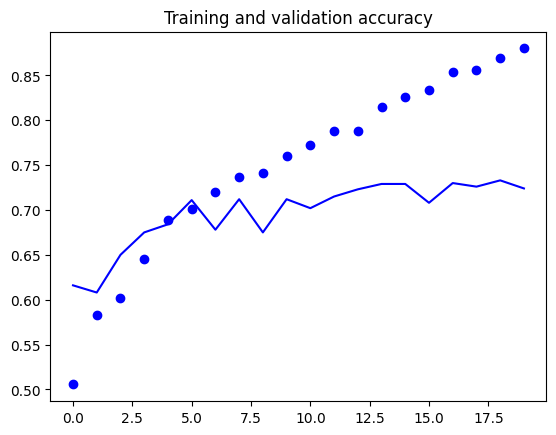

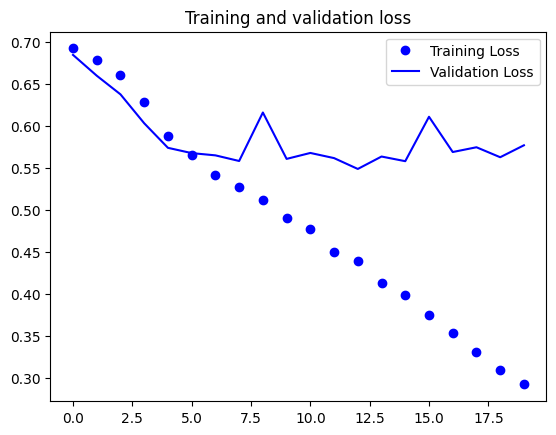

In [ ]:
plot_loss_acc(history)

In [ ]:
# model with augmentation
model_for_aug = create_model()

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

# no need to augment test
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode="binary"
)

validation_generator = test_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode="binary"
)

history_with_aug = model_for_aug.fit(
    train_generator,
    steps_per_epoch=100,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=50,
    verbose=2
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/20
100/100 - 23s - loss: 0.6946 - accuracy: 0.5045 - val_loss: 0.6902 - val_accuracy: 0.5160 - 23s/epoch - 235ms/step
Epoch 2/20
100/100 - 15s - loss: 0.6856 - accuracy: 0.5545 - val_loss: 0.6787 - val_accuracy: 0.5260 - 15s/epoch - 148ms/step
Epoch 3/20
100/100 - 14s - loss: 0.6811 - accuracy: 0.5595 - val_loss: 0.6790 - val_accuracy: 0.5300 - 14s/epoch - 144ms/step
Epoch 4/20
100/100 - 15s - loss: 0.6745 - accuracy: 0.5690 - val_loss: 0.6536 - val_accuracy: 0.6170 - 15s/epoch - 153ms/step
Epoch 5/20
100/100 - 14s - loss: 0.6716 - accuracy: 0.5795 - val_loss: 0.6555 - val_accuracy: 0.5880 - 14s/epoch - 144ms/step
Epoch 6/20
100/100 - 14s - loss: 0.6590 - accuracy: 0.5925 - val_loss: 0.6674 - val_accuracy: 0.5570 - 14s/epoch - 144ms/step
Epoch 7/20
100/100 - 14s - loss: 0.6496 - accuracy: 0.6125 - val_loss: 0.6133 - val_accuracy: 0.6580 - 14s/epoch - 144ms/step
Epoch 8/20
100/100 - 15s - loss: 0

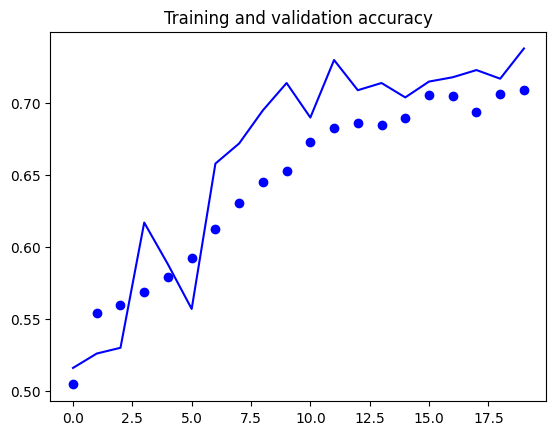

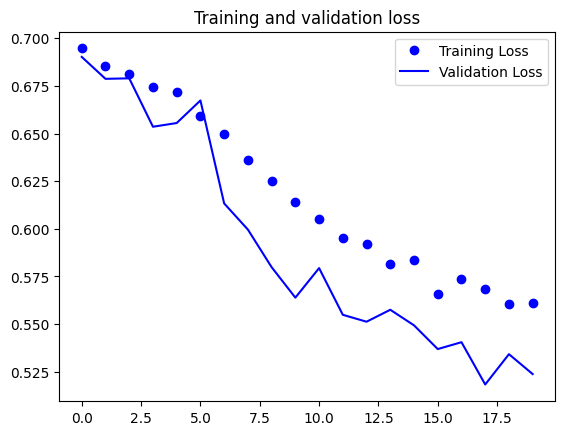

In [ ]:
plot_loss_acc(history_with_aug)

### Lab 2

In [ ]:
# Download the training set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2023-08-30 17:12:41--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.197.128, 74.125.135.128, 74.125.142.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.197.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip’

horse-or-human.zip  100%[===================>] 142.65M   197MB/s    in 0.7s    

2023-08-30 17:12:42 (197 MB/s) - ‘horse-or-human.zip’ saved [149574867/149574867]



In [ ]:
# Download the validation set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip

--2023-08-30 17:12:42--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.197.128, 74.125.135.128, 74.125.142.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.197.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11480187 (11M) [application/zip]
Saving to: ‘validation-horse-or-human.zip’

validation-horse-or 100%[===================>]  10.95M  --.-KB/s    in 0.05s   

2023-08-30 17:12:42 (200 MB/s) - ‘validation-horse-or-human.zip’ saved [11480187/11480187]



In [ ]:
import os
import zipfile

train_dir = 'tmp/horse-or-human'
val_dir = 'tmp/validation-horse-or-human'

zip_ref = zipfile.ZipFile('./horse-or-human.zip', 'r')
zip_ref.extractall(train_dir)

zip_ref = zipfile.ZipFile('./validation-horse-or-human.zip', 'r')
zip_ref.extractall(val_dir)

zip_ref.close()

train_horse_dir = os.path.join('tmp/horse-or-human/horses')
train_human_dir = os.path.join('tmp/horse-or-human/humans')
validation_horse_dir = os.path.join('tmp/validation-horse-or-human/horses')
validation_human_dir = os.path.join('tmp/validation-horse-or-human/humans')

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss="binary_crossentropy",
              optimizer=RMSprop(learning_rate=1e-4),
              metrics=["accuracy"])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(300, 300),
        batch_size=128,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        val_dir,
        target_size=(300, 300),
        batch_size=32,
        class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [ ]:
EPOCHS = 20

history = model.fit(
      train_generator,
      steps_per_epoch=8,  # 8 * 128 = 1024
      epochs=EPOCHS,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8 # 8 * 32 = 256
      )

Epoch 1/20
8/8 [==============================] - 37s 3s/step - loss: 0.6878 - accuracy: 0.5317 - val_loss: 0.7072 - val_accuracy: 0.5000
Epoch 2/20
8/8 [==============================] - 30s 4s/step - loss: 0.6786 - accuracy: 0.5473 - val_loss: 0.6818 - val_accuracy: 0.5039
Epoch 3/20
8/8 [==============================] - 25s 3s/step - loss: 0.6575 - accuracy: 0.6096 - val_loss: 0.6727 - val_accuracy: 0.7266
Epoch 4/20
8/8 [==============================] - 24s 3s/step - loss: 0.6398 - accuracy: 0.6463 - val_loss: 0.6673 - val_accuracy: 0.5195
Epoch 5/20
8/8 [==============================] - 29s 3s/step - loss: 0.6352 - accuracy: 0.6307 - val_loss: 0.7388 - val_accuracy: 0.5000
Epoch 6/20
8/8 [==============================] - 35s 4s/step - loss: 0.6064 - accuracy: 0.6663 - val_loss: 0.7974 - val_accuracy: 0.5000
Epoch 7/20
8/8 [==============================] - 24s 3s/step - loss: 0.5972 - accuracy: 0.6630 - val_loss: 1.0282 - val_accuracy: 0.5000
Epoch 8/20
8/8 [==================

In [ ]:
import matplotlib.pyplot as plt

def plot_loss_acc(history):
  '''Plots the training and validation loss and accuracy from a history object'''
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(acc))

  plt.plot(epochs, acc, 'bo', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend()

  plt.figure()

  plt.plot(epochs, loss, 'bo', label='Training Loss')
  plt.plot(epochs, val_loss, 'b', label='Validation Loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

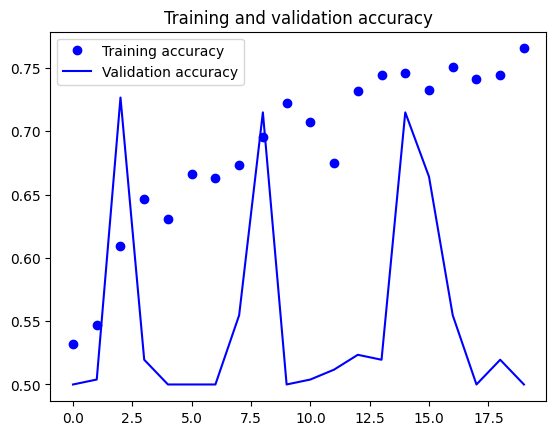

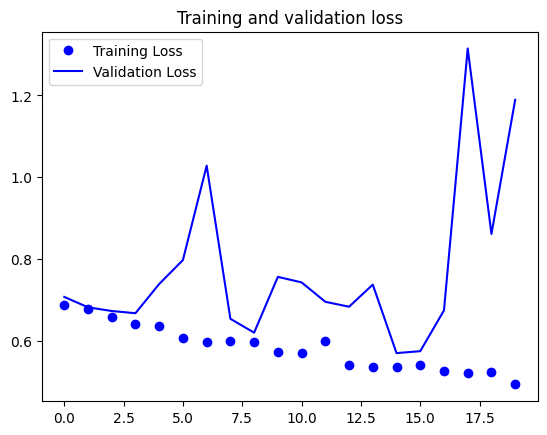

In [ ]:
plot_loss_acc(history)

## Week 3

### Lab 1


In [ ]:
import tensorflow as tf

fmnist = tf.keras.datasets.fashion_mnist
(training_images, training_labels), (test_images, test_labels) = fmnist.load_data()

training_images = training_images / 255.0
test_images = test_images / 255.0

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
# shallow NN
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(10, activation=tf.nn.softmax)
])

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

print("MODEL TRAINING:")
model.fit(training_images, training_labels, epochs=5)

print("MODEL EVALUATION")
test_loss = model.evaluate(test_images, test_labels)

MODEL TRAINING:
Epoch 1/5
1875/1875 [==============================] - 6s 2ms/step - loss: 0.4980 - accuracy: 0.8249
Epoch 2/5
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3734 - accuracy: 0.8645
Epoch 3/5
1875/1875 [==============================] - 5s 2ms/step - loss: 0.3356 - accuracy: 0.8780
Epoch 4/5
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3142 - accuracy: 0.8844
Epoch 5/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2938 - accuracy: 0.8911
MODEL EVALUATION
313/313 [==============================] - 1s 2ms/step - loss: 0.3783 - accuracy: 0.8606


In [ ]:
# CNN
model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(28, 28, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

print("MODEL TRAINING:")
model.fit(training_images, training_labels, epochs=5)

print("MODEL EVALUATION")
test_loss = model.evaluate(test_images, test_labels)

MODEL TRAINING:
Epoch 1/5
1875/1875 [==============================] - 9s 4ms/step - loss: 0.4752 - accuracy: 0.8256
Epoch 2/5
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3217 - accuracy: 0.8838
Epoch 3/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2756 - accuracy: 0.8982
Epoch 4/5
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2473 - accuracy: 0.9083
Epoch 5/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2225 - accuracy: 0.9176
MODEL EVALUATION
313/313 [==============================] - 1s 3ms/step - loss: 0.2602 - accuracy: 0.9068


In [ ]:
print(test_labels[:100])

[9 2 1 1 6 1 4 6 5 7 4 5 7 3 4 1 2 4 8 0 2 5 7 9 1 4 6 0 9 3 8 8 3 3 8 0 7
 5 7 9 6 1 3 7 6 7 2 1 2 2 4 4 5 8 2 2 8 4 8 0 7 7 8 5 1 1 2 3 9 8 7 0 2 6
 2 3 1 2 8 4 1 8 5 9 5 0 3 2 0 6 5 3 6 7 1 8 0 1 4 2]


1/1 [==============================] - 0s 17ms/step


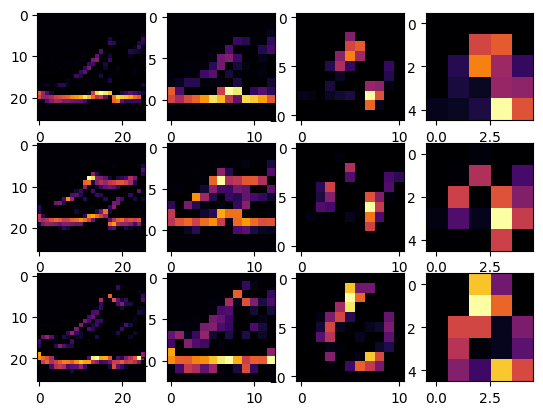

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras import models

f, axarr = plt.subplots(3,4)

FIRST_IMAGE=0
SECOND_IMAGE=23
THIRD_IMAGE=28
CONVOLUTION_NUMBER = 1

layer_outputs = [layer.output for layer in model.layers]
activation_model = tf.keras.models.Model(inputs = model.input, outputs = layer_outputs)

for x in range(0,4):
  f1 = activation_model.predict(test_images[FIRST_IMAGE].reshape(1, 28, 28, 1))[x]
  axarr[0,x].imshow(f1[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[0,x].grid(False)

  f2 = activation_model.predict(test_images[SECOND_IMAGE].reshape(1, 28, 28, 1))[x]
  axarr[1,x].imshow(f2[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[1,x].grid(False)

  f3 = activation_model.predict(test_images[THIRD_IMAGE].reshape(1, 28, 28, 1))[x]
  axarr[2,x].imshow(f3[0, : , :, CONVOLUTION_NUMBER], cmap='inferno')
  axarr[2,x].grid(False)

### Lab 2

In [ ]:
from scipy import datasets

ascent_image = datasets.ascent()

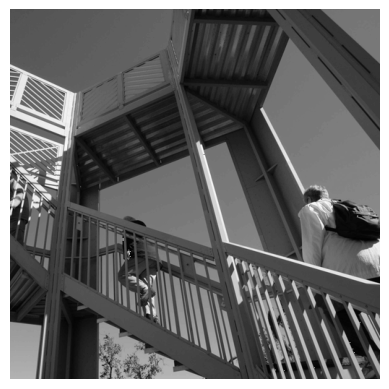

In [ ]:
import matplotlib.pyplot as plt

plt.grid(False)
plt.gray()
plt.axis('off')
plt.imshow(ascent_image)
plt.show()

In [ ]:
# Convolution
import numpy as np

image_transformed = np.copy(ascent_image)

size_x = image_transformed.shape[0]
size_y = image_transformed.shape[1]

In [ ]:
filter = [ [0, 1, 0], [1, -4, 1], [0, 1, 0]]

weight  = 1

In [ ]:
for x in range(1,size_x-1):
  for y in range(1,size_y-1):
      convolution = 0.0
      convolution = convolution + (ascent_image[x-1, y-1] * filter[0][0])
      convolution = convolution + (ascent_image[x-1, y] * filter[0][1])
      convolution = convolution + (ascent_image[x-1, y+1] * filter[0][2])
      convolution = convolution + (ascent_image[x, y-1] * filter[1][0])
      convolution = convolution + (ascent_image[x, y] * filter[1][1])
      convolution = convolution + (ascent_image[x, y+1] * filter[1][2])
      convolution = convolution + (ascent_image[x+1, y-1] * filter[2][0])
      convolution = convolution + (ascent_image[x+1, y] * filter[2][1])
      convolution = convolution + (ascent_image[x+1, y+1] * filter[2][2])

      convolution = convolution * weight

      if(convolution<0):
        convolution=0
      if(convolution>255):
        convolution=255

      image_transformed[x, y] = convolution

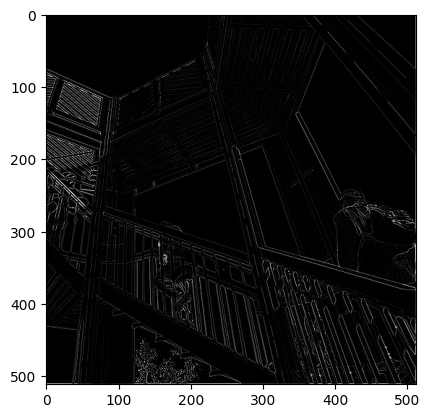

In [ ]:
plt.gray()
plt.grid(False)
plt.imshow(image_transformed)
plt.show()

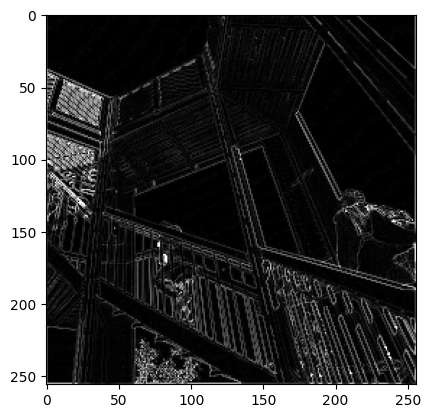

In [ ]:
# Max Pooling
new_x = int(size_x/2)
new_y = int(size_y/2)

newImage = np.zeros((new_x, new_y))

for x in range(0, size_x, 2):
  for y in range(0, size_y, 2):

    pixels = []
    pixels.append(image_transformed[x, y])
    pixels.append(image_transformed[x+1, y])
    pixels.append(image_transformed[x, y+1])
    pixels.append(image_transformed[x+1, y+1])

    newImage[int(x/2), int(y/2)] = max(pixels)

plt.gray()
plt.grid(False)
plt.imshow(newImage)
plt.show()

## Week 4

### Lab 1

In [ ]:
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2023-08-30 17:48:43--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.117.128, 142.250.99.128, 142.250.107.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.117.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip.1’

horse-or-human.zip. 100%[===================>] 142.65M  99.8MB/s    in 1.4s    

2023-08-30 17:48:45 (99.8 MB/s) - ‘horse-or-human.zip.1’ saved [149574867/149574867]



In [ ]:
import zipfile

local_zip = './horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./horse-or-human')
zip_ref.close()

In [ ]:
import os

train_horse_dir = os.path.join('./horse-or-human/horses')
train_human_dir = os.path.join('./horse-or-human/humans')

In [ ]:
train_horse_names = os.listdir(train_horse_dir)
print(train_horse_names[:10])

train_human_names = os.listdir(train_human_dir)
print(train_human_names[:10])

['horse09-2.png', 'horse45-8.png', 'horse28-6.png', 'horse24-1.png', 'horse16-6.png', 'horse24-5.png', 'horse03-2.png', 'horse40-1.png', 'horse40-6.png', 'horse36-3.png']
['human07-20.png', 'human13-14.png', 'human08-17.png', 'human17-19.png', 'human01-09.png', 'human03-01.png', 'human17-25.png', 'human16-29.png', 'human08-07.png', 'human10-16.png']


In [ ]:
print('total training horse images:', len(os.listdir(train_horse_dir)))
print('total training human images:', len(os.listdir(train_human_dir)))

total training horse images: 500
total training human images: 527


In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# graph configuration 4 * 4
nrows = 4
ncols = 4

# Index
pic_index = 0

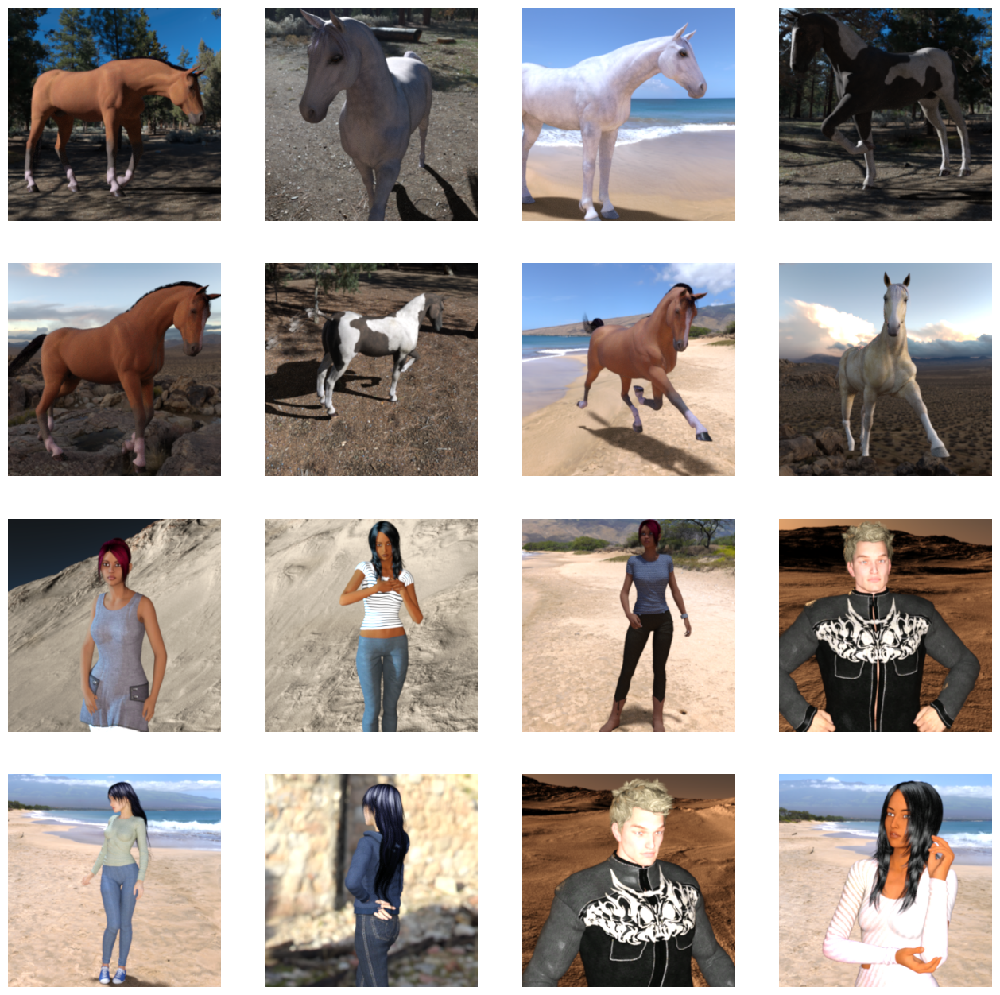

In [ ]:
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_horse_pix = [os.path.join(train_horse_dir, fname)
                for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix = [os.path.join(train_human_dir, fname)
                for fname in train_human_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
import tensorflow as tf

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 149, 149, 16)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 73, 73, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 35, 35, 64)      

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        './horse-or-human/',
        target_size=(300, 300),
        batch_size=128,
        class_mode='binary')

Found 1027 images belonging to 2 classes.


In [ ]:
history = model.fit(
      train_generator,
      steps_per_epoch=8,  # 8 * 128 = 1024
      epochs=15,
      verbose=1)

Epoch 1/15
8/8 [==============================] - 8s 668ms/step - loss: 0.7517 - accuracy: 0.5184
Epoch 2/15
8/8 [==============================] - 6s 762ms/step - loss: 0.6954 - accuracy: 0.6240
Epoch 3/15
8/8 [==============================] - 7s 867ms/step - loss: 0.6505 - accuracy: 0.6263
Epoch 4/15
8/8 [==============================] - 9s 1s/step - loss: 1.1123 - accuracy: 0.6696
Epoch 5/15
8/8 [==============================] - 6s 759ms/step - loss: 0.4574 - accuracy: 0.8209
Epoch 6/15
8/8 [==============================] - 7s 876ms/step - loss: 0.2772 - accuracy: 0.8936
Epoch 7/15
8/8 [==============================] - 7s 832ms/step - loss: 0.2350 - accuracy: 0.8988
Epoch 8/15
8/8 [==============================] - 10s 1s/step - loss: 0.1247 - accuracy: 0.9522
Epoch 9/15
8/8 [==============================] - 8s 1s/step - loss: 0.3184 - accuracy: 0.8779
Epoch 10/15
8/8 [==============================] - 6s 771ms/step - loss: 0.1406 - accuracy: 0.9477
Epoch 11/15
8/8 [==========

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():
  path = '/content/' + fn
  img = load_img(path, target_size=(300, 300))
  x = img_to_array(img)
  x /= 255
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(classes[0])

  if classes[0]>0.5:
    print(fn + " is a human")
  else:
    print(fn + " is a horse")

Saving download.jpg to download.jpg
1/1 [==============================] - 0s 277ms/step
[0.04106442]
download.jpg is a horse


1/1 [==============================] - 0s 232ms/step


<ipython-input-40-9348a4178994>:34: RuntimeWarning: invalid value encountered in divide
  x /= x.std()


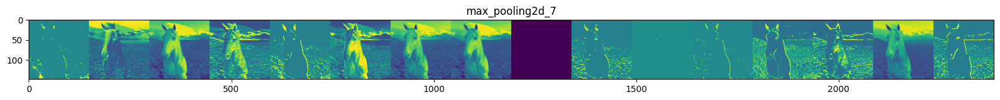

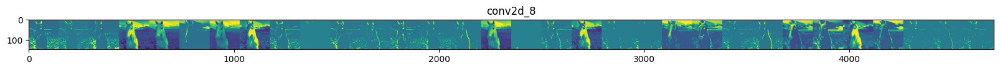

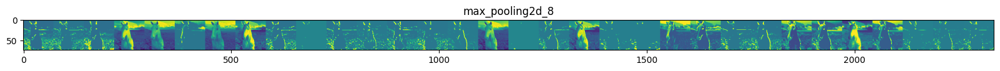

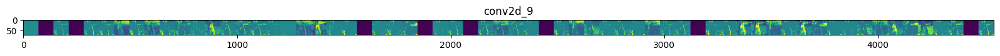

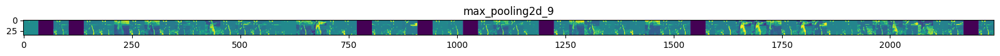

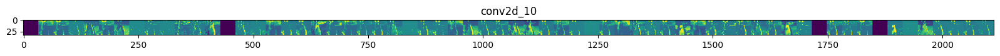

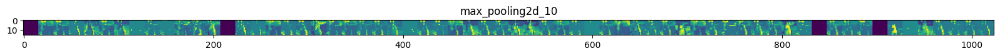

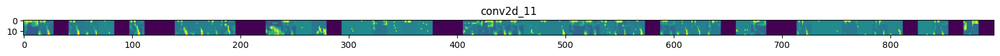

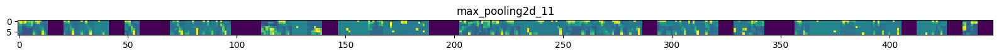

In [ ]:
import numpy as np
import random
from tensorflow.keras.utils import img_to_array, load_img

successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

horse_img_files = [os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files = [os.path.join(train_human_dir, f) for f in train_human_names]
img_path = random.choice(horse_img_files + human_img_files)

img = load_img(img_path, target_size=(300, 300))
x = img_to_array(img)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 300, 300, 3)

x /= 255

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers[1:]]

for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    n_features = feature_map.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]

    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')

      # Tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x

    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### Lab 2

In [ ]:
# Download the training set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2023-08-30 18:01:44--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.199.128, 74.125.195.128, 172.253.117.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.199.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip.2’

horse-or-human.zip. 100%[===================>] 142.65M   185MB/s    in 0.8s    

2023-08-30 18:01:45 (185 MB/s) - ‘horse-or-human.zip.2’ saved [149574867/149574867]



In [ ]:
# Download the validation set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip

--2023-08-30 18:01:54--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.199.128, 74.125.195.128, 172.253.117.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.199.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11480187 (11M) [application/zip]
Saving to: ‘validation-horse-or-human.zip.1’

validation-horse-or 100%[===================>]  10.95M  --.-KB/s    in 0.06s   

2023-08-30 18:01:54 (197 MB/s) - ‘validation-horse-or-human.zip.1’ saved [11480187/11480187]



In [ ]:
import zipfile

local_zip = './horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./horse-or-human')

local_zip = './validation-horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./validation-horse-or-human')

zip_ref.close()

In [ ]:
import os

train_horse_dir = os.path.join('./horse-or-human/horses')
train_human_dir = os.path.join('./horse-or-human/humans')
validation_horse_dir = os.path.join('./validation-horse-or-human/horses')
validation_human_dir = os.path.join('./validation-horse-or-human/humans')

In [ ]:
train_horse_names = os.listdir(train_horse_dir)
print(f'TRAIN SET HORSES: {train_horse_names[:10]}')

train_human_names = os.listdir(train_human_dir)
print(f'TRAIN SET HUMANS: {train_human_names[:10]}')

validation_horse_names = os.listdir(validation_horse_dir)
print(f'VAL SET HORSES: {validation_horse_names[:10]}')

validation_human_names = os.listdir(validation_human_dir)
print(f'VAL SET HUMANS: {validation_human_names[:10]}')

TRAIN SET HORSES: ['horse09-2.png', 'horse45-8.png', 'horse28-6.png', 'horse24-1.png', 'horse16-6.png', 'horse24-5.png', 'horse03-2.png', 'horse40-1.png', 'horse40-6.png', 'horse36-3.png']
TRAIN SET HUMANS: ['human07-20.png', 'human13-14.png', 'human08-17.png', 'human17-19.png', 'human01-09.png', 'human03-01.png', 'human17-25.png', 'human16-29.png', 'human08-07.png', 'human10-16.png']
VAL SET HORSES: ['horse2-136.png', 'horse2-183.png', 'horse1-554.png', 'horse6-161.png', 'horse1-122.png', 'horse6-218.png', 'horse4-599.png', 'horse5-405.png', 'horse5-032.png', 'horse1-170.png']
VAL SET HUMANS: ['valhuman04-06.png', 'valhuman03-08.png', 'valhuman01-10.png', 'valhuman05-07.png', 'valhuman01-17.png', 'valhuman01-00.png', 'valhuman02-00.png', 'valhuman03-04.png', 'valhuman01-12.png', 'valhuman02-08.png']


In [ ]:
print(f'total training horse images: {len(os.listdir(train_horse_dir))}')
print(f'total training human images: {len(os.listdir(train_human_dir))}')
print(f'total validation horse images: {len(os.listdir(validation_horse_dir))}')
print(f'total validation human images: {len(os.listdir(validation_human_dir))}')

total training horse images: 500
total training human images: 527
total validation horse images: 128
total validation human images: 128


In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 4
ncols = 4

pic_index = 0

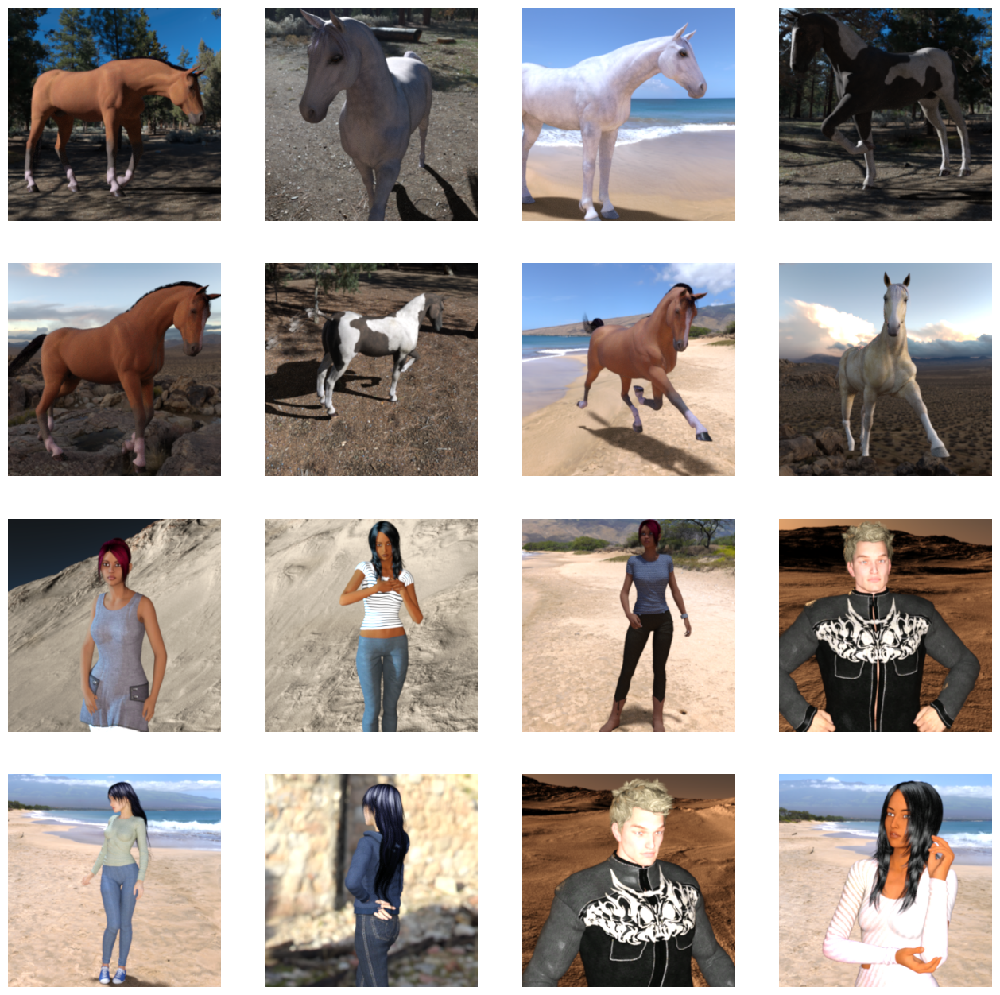

In [ ]:
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_horse_pix = [os.path.join(train_horse_dir, fname)
                for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix = [os.path.join(train_human_dir, fname)
                for fname in train_human_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 149, 149, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 73, 73, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 35, 35, 64)       0

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        './horse-or-human/',
        target_size=(300, 300),
        batch_size=128,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        './validation-horse-or-human/',
        target_size=(300, 300),
        batch_size=32,
        class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [ ]:
history = model.fit(
      train_generator,
      steps_per_epoch=8,  # 8 * 128 = 1024
      epochs=15,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8 # 8 * 32 = 256
      )

Epoch 1/15
8/8 [==============================] - 20s 2s/step - loss: 0.7443 - accuracy: 0.4839 - val_loss: 0.6884 - val_accuracy: 0.5000
Epoch 2/15
8/8 [==============================] - 8s 966ms/step - loss: 0.6893 - accuracy: 0.5584 - val_loss: 0.6703 - val_accuracy: 0.5352
Epoch 3/15
8/8 [==============================] - 8s 972ms/step - loss: 0.6964 - accuracy: 0.6663 - val_loss: 0.5473 - val_accuracy: 0.8750
Epoch 4/15
8/8 [==============================] - 9s 1s/step - loss: 0.6507 - accuracy: 0.7097 - val_loss: 0.5645 - val_accuracy: 0.6992
Epoch 5/15
8/8 [==============================] - 9s 1s/step - loss: 0.7417 - accuracy: 0.7697 - val_loss: 1.4370 - val_accuracy: 0.6289
Epoch 6/15
8/8 [==============================] - 15s 2s/step - loss: 0.4175 - accuracy: 0.8231 - val_loss: 0.3061 - val_accuracy: 0.9062
Epoch 7/15
8/8 [==============================] - 13s 1s/step - loss: 0.4881 - accuracy: 0.8420 - val_loss: 0.3601 - val_accuracy: 0.8789
Epoch 8/15
8/8 [================

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():
  path = '/content/' + fn
  img = load_img(path, target_size=(300, 300))
  x = img_to_array(img)
  x /= 255
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is a human")
  else:
    print(fn + " is a horse")

Saving download.png to download.png
1/1 [==============================] - 0s 310ms/step
[0.9986131]
download.png is a human


1/1 [==============================] - 0s 103ms/step


<ipython-input-16-bd1fc9b32c6a>:32: RuntimeWarning: invalid value encountered in divide
  x /= x.std()


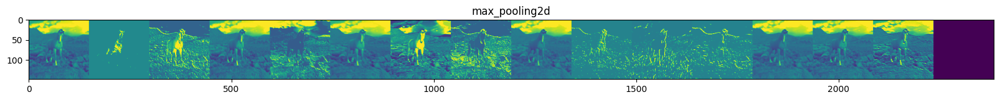

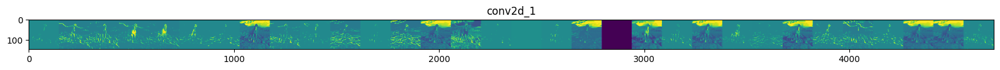

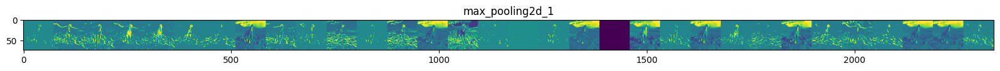

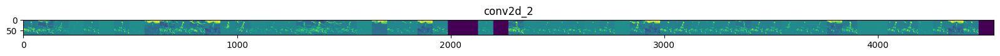

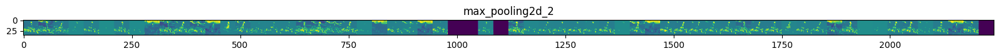

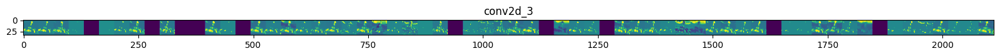

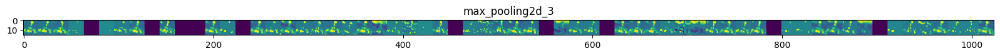

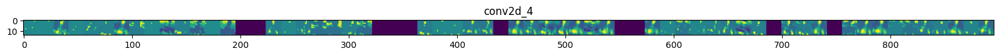

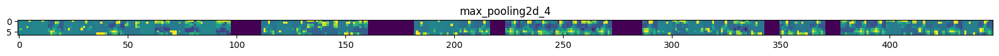

In [ ]:
import numpy as np
import random
from tensorflow.keras.utils import img_to_array, load_img

successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

horse_img_files = [os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files = [os.path.join(train_human_dir, f) for f in train_human_names]
img_path = random.choice(horse_img_files + human_img_files)

img = load_img(img_path, target_size=(300, 300))
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

x /= 255

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers[1:]]

for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    n_features = feature_map.shape[-1]
    size = feature_map.shape[1]

    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')

      display_grid[:, i * size : (i + 1) * size] = x

    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### Lab 3

In [ ]:
# Download the training set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2023-08-30 18:10:08--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 108.177.98.128, 74.125.197.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip.4’

horse-or-human.zip. 100%[===================>] 142.65M   136MB/s    in 1.1s    

2023-08-30 18:10:09 (136 MB/s) - ‘horse-or-human.zip.4’ saved [149574867/149574867]



In [ ]:
# Download the validation set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip

--2023-08-30 18:10:09--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 108.177.98.128, 74.125.197.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11480187 (11M) [application/zip]
Saving to: ‘validation-horse-or-human.zip.2’

validation-horse-or 100%[===================>]  10.95M  --.-KB/s    in 0.1s    

2023-08-30 18:10:09 (81.5 MB/s) - ‘validation-horse-or-human.zip.2’ saved [11480187/11480187]



In [ ]:
import os

train_horse_dir = os.path.join('./horse-or-human/horses')
train_human_dir = os.path.join('./horse-or-human/humans')
validation_horse_dir = os.path.join('./validation-horse-or-human/horses')
validation_human_dir = os.path.join('./validation-horse-or-human/humans')

In [ ]:
train_horse_names = os.listdir(train_horse_dir)
print(f'TRAIN SET HORSES: {train_horse_names[:10]}')

train_human_names = os.listdir(train_human_dir)
print(f'TRAIN SET HUMANS: {train_human_names[:10]}')

validation_horse_hames = os.listdir(validation_horse_dir)
print(f'VAL SET HORSES: {validation_horse_hames[:10]}')

validation_human_names = os.listdir(validation_human_dir)
print(f'VAL SET HUMANS: {validation_human_names[:10]}')

TRAIN SET HORSES: ['horse09-2.png', 'horse45-8.png', 'horse28-6.png', 'horse24-1.png', 'horse16-6.png', 'horse24-5.png', 'horse03-2.png', 'horse40-1.png', 'horse40-6.png', 'horse36-3.png']
TRAIN SET HUMANS: ['human07-20.png', 'human13-14.png', 'human08-17.png', 'human17-19.png', 'human01-09.png', 'human03-01.png', 'human17-25.png', 'human16-29.png', 'human08-07.png', 'human10-16.png']
VAL SET HORSES: ['horse2-136.png', 'horse2-183.png', 'horse1-554.png', 'horse6-161.png', 'horse1-122.png', 'horse6-218.png', 'horse4-599.png', 'horse5-405.png', 'horse5-032.png', 'horse1-170.png']
VAL SET HUMANS: ['valhuman04-06.png', 'valhuman03-08.png', 'valhuman01-10.png', 'valhuman05-07.png', 'valhuman01-17.png', 'valhuman01-00.png', 'valhuman02-00.png', 'valhuman03-04.png', 'valhuman01-12.png', 'valhuman02-08.png']


In [ ]:
print(f'total training horse images: {len(os.listdir(train_horse_dir))}')
print(f'total training human images: {len(os.listdir(train_human_dir))}')
print(f'total validation horse images: {len(os.listdir(validation_horse_dir))}')
print(f'total validation human images: {len(os.listdir(validation_human_dir))}')

total training horse images: 500
total training human images: 527
total validation horse images: 128
total validation human images: 128


In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 74, 74, 16)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 17, 17, 64)      

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        './horse-or-human/',
        target_size=(150, 150),
        batch_size=128,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        './validation-horse-or-human/',
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [ ]:
history = model.fit(
      train_generator,
      steps_per_epoch=8,
      epochs=15,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8
      )

Epoch 1/15
8/8 [==============================] - 10s 951ms/step - loss: 2.7154 - accuracy: 0.4917 - val_loss: 0.6914 - val_accuracy: 0.5000
Epoch 2/15
8/8 [==============================] - 7s 944ms/step - loss: 0.6690 - accuracy: 0.5811 - val_loss: 0.6651 - val_accuracy: 0.5156
Epoch 3/15
8/8 [==============================] - 7s 838ms/step - loss: 0.6501 - accuracy: 0.7030 - val_loss: 0.8555 - val_accuracy: 0.5000
Epoch 4/15
8/8 [==============================] - 6s 774ms/step - loss: 0.5047 - accuracy: 0.7451 - val_loss: 1.7088 - val_accuracy: 0.5000
Epoch 5/15
8/8 [==============================] - 8s 994ms/step - loss: 0.5683 - accuracy: 0.7419 - val_loss: 0.8117 - val_accuracy: 0.6523
Epoch 6/15
8/8 [==============================] - 11s 1s/step - loss: 0.3576 - accuracy: 0.8465 - val_loss: 0.7587 - val_accuracy: 0.7070
Epoch 7/15
8/8 [==============================] - 12s 2s/step - loss: 0.3410 - accuracy: 0.8776 - val_loss: 0.9069 - val_accuracy: 0.7695
Epoch 8/15
8/8 [=======

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():
  path = '/content/' + fn
  img = load_img(path, target_size=(150, 150))
  x = img_to_array(img)
  x /= 255
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is a human")
  else:
    print(fn + " is a horse")

Saving download.png to download (1).png
1/1 [==============================] - 0s 170ms/step
[0.9999802]
download (1).png is a human


1/1 [==============================] - 0s 133ms/step


<ipython-input-28-1459c08a6eb3>:35: RuntimeWarning: invalid value encountered in divide
  x /= x.std()


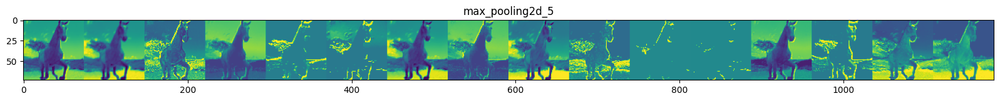

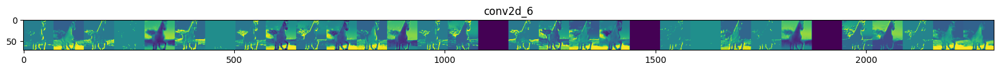

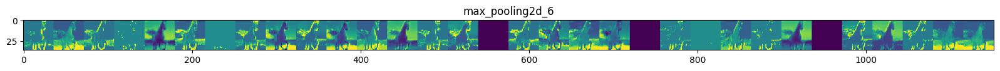

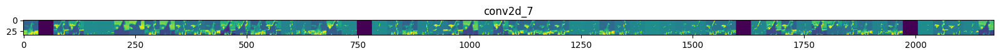

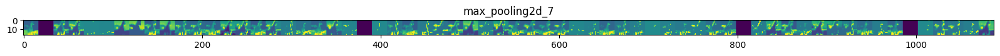

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.utils import img_to_array, load_img

successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

horse_img_files = [os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files = [os.path.join(train_human_dir, f) for f in train_human_names]
img_path = random.choice(horse_img_files + human_img_files)
img = load_img(img_path, target_size=(150, 150))
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

x /= 255

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers[1:]]

for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    n_features = feature_map.shape[-1]

    size = feature_map.shape[1]

    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')

      display_grid[:, i * size : (i + 1) * size] = x

    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

# Course 2

## Week 1

### Lab 1

In [ ]:
!wget --no-check-certificate https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip

--2023-08-30 18:16:43--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.195.128, 172.253.117.128, 142.250.99.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.195.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip.1’

cats_and_dogs_filte 100%[===================>]  65.43M   158MB/s    in 0.4s    

2023-08-30 18:16:43 (158 MB/s) - ‘cats_and_dogs_filtered.zip.1’ saved [68606236/68606236]



In [ ]:
import zipfile

local_zip = './cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall()

zip_ref.close()

In [ ]:
import os

base_dir = 'cats_and_dogs_filtered'

print("Contents of base directory:")
print(os.listdir(base_dir))

print("\nContents of train directory:")
print(os.listdir(f'{base_dir}/train'))

print("\nContents of validation directory:")
print(os.listdir(f'{base_dir}/validation'))

Contents of base directory:
['vectorize.py', 'train', 'validation']

Contents of train directory:
['dogs', 'cats']

Contents of validation directory:
['dogs', 'cats']


In [ ]:
import os

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

In [ ]:
train_cat_fnames = os.listdir( train_cats_dir )
train_dog_fnames = os.listdir( train_dogs_dir )

print(train_cat_fnames[:10])
print(train_dog_fnames[:10])

['cat.565.jpg', 'cat.97.jpg', 'cat.783.jpg', 'cat.454.jpg', 'cat.315.jpg', 'cat.803.jpg', 'cat.201.jpg', 'cat.514.jpg', 'cat.978.jpg', 'cat.734.jpg']
['dog.122.jpg', 'dog.816.jpg', 'dog.195.jpg', 'dog.761.jpg', 'dog.763.jpg', 'dog.490.jpg', 'dog.108.jpg', 'dog.416.jpg', 'dog.638.jpg', 'dog.299.jpg']


In [ ]:
print('total training cat images :', len(os.listdir(train_cats_dir ) ))
print('total training dog images :', len(os.listdir(train_dogs_dir ) ))

print('total validation cat images :', len(os.listdir( validation_cats_dir ) ))
print('total validation dog images :', len(os.listdir( validation_dogs_dir ) ))

total training cat images : 1000
total training dog images : 1000
total validation cat images : 500
total validation dog images : 500


In [ ]:
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

nrows = 4
ncols = 4

pic_index = 0

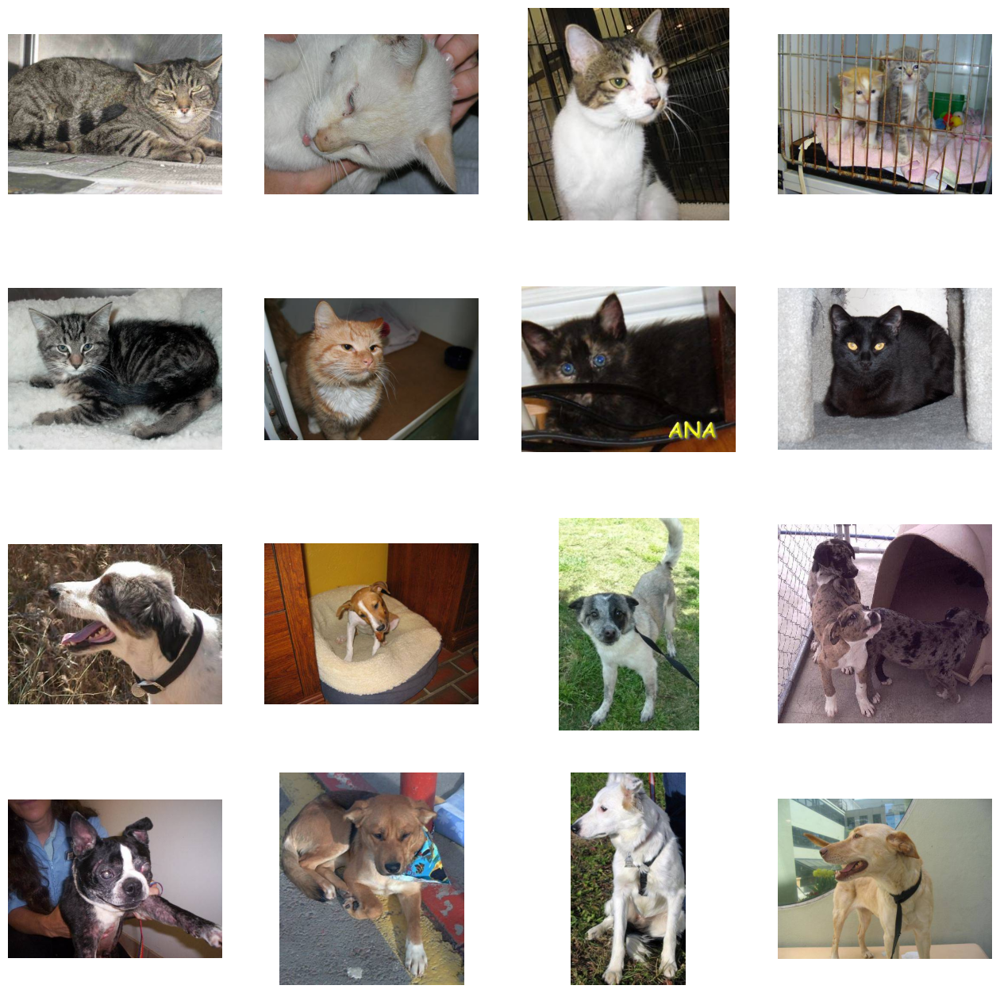

In [ ]:
fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index+=8

next_cat_pix = [os.path.join(train_cats_dir, fname)
                for fname in train_cat_fnames[ pic_index-8:pic_index]
               ]

next_dog_pix = [os.path.join(train_dogs_dir, fname)
                for fname in train_dog_fnames[ pic_index-8:pic_index]
               ]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 16)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 17, 17, 64)      

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer=RMSprop(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics = ['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator( rescale = 1.0/255. )
test_datagen  = ImageDataGenerator( rescale = 1.0/255. )

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size=20,
                                                    class_mode='binary',
                                                    target_size=(150, 150))

validation_generator =  test_datagen.flow_from_directory(validation_dir,
                                                         batch_size=20,
                                                         class_mode  = 'binary',
                                                         target_size = (150, 150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
history = model.fit(
            train_generator,
            epochs=15,
            validation_data=validation_generator,
            verbose=2
            )

Epoch 1/15
100/100 - 8s - loss: 0.7325 - accuracy: 0.5275 - val_loss: 0.6840 - val_accuracy: 0.5240 - 8s/epoch - 83ms/step
Epoch 2/15
100/100 - 6s - loss: 0.6627 - accuracy: 0.6200 - val_loss: 0.7789 - val_accuracy: 0.5190 - 6s/epoch - 61ms/step
Epoch 3/15
100/100 - 7s - loss: 0.5799 - accuracy: 0.6995 - val_loss: 0.5544 - val_accuracy: 0.7130 - 7s/epoch - 67ms/step
Epoch 4/15
100/100 - 7s - loss: 0.5312 - accuracy: 0.7360 - val_loss: 0.6440 - val_accuracy: 0.6580 - 7s/epoch - 68ms/step
Epoch 5/15
100/100 - 4s - loss: 0.4748 - accuracy: 0.7715 - val_loss: 0.5397 - val_accuracy: 0.7420 - 4s/epoch - 45ms/step
Epoch 6/15
100/100 - 8s - loss: 0.4170 - accuracy: 0.8055 - val_loss: 0.5445 - val_accuracy: 0.7450 - 8s/epoch - 82ms/step
Epoch 7/15
100/100 - 6s - loss: 0.3398 - accuracy: 0.8470 - val_loss: 0.5790 - val_accuracy: 0.7270 - 6s/epoch - 64ms/step
Epoch 8/15
100/100 - 5s - loss: 0.2531 - accuracy: 0.8925 - val_loss: 0.6835 - val_accuracy: 0.7350 - 5s/epoch - 54ms/step
Epoch 9/15
100/1

In [ ]:
import numpy as np

from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded=files.upload()

for fn in uploaded.keys():
  path='/content/' + fn
  img=load_img(path, target_size=(150, 150))

  x=img_to_array(img)
  x /= 255
  x=np.expand_dims(x, axis=0)
  images = np.vstack([x])

  classes = model.predict(images, batch_size=10)

  print(classes[0])

  if classes[0]>0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving download.png to download (2).png
1/1 [==============================] - 0s 84ms/step
[0.9999634]
download (2).png is a dog


1/1 [==============================] - 0s 183ms/step


<ipython-input-44-43ddfe0c4fc8>:34: RuntimeWarning: invalid value encountered in divide
  x /= x.std ()


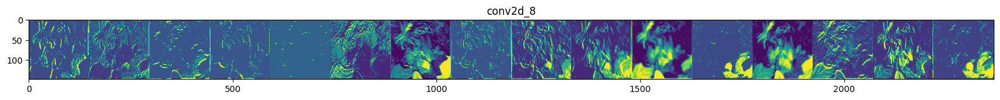

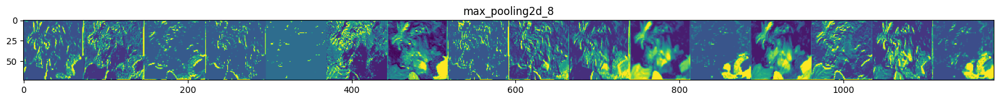

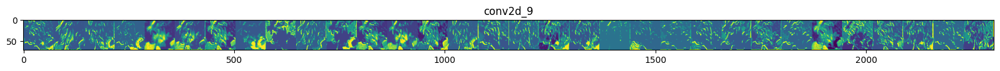

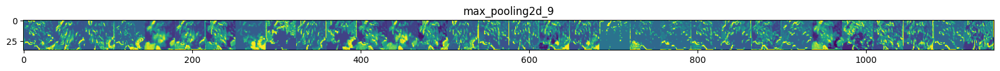

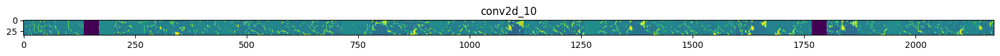

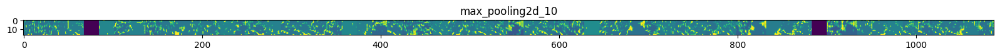

In [ ]:
import numpy as np
import random
from tensorflow.keras.utils import img_to_array, load_img

successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

cat_img_files = [os.path.join(train_cats_dir, f) for f in train_cat_fnames]
dog_img_files = [os.path.join(train_dogs_dir, f) for f in train_dog_fnames]
img_path = random.choice(cat_img_files + dog_img_files)
img = load_img(img_path, target_size=(150, 150))
x   = img_to_array(img)
x   = x.reshape((1,) + x.shape)

x /= 255.0

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers]

for layer_name, feature_map in zip(layer_names, successive_feature_maps):

  if len(feature_map.shape) == 4:

    n_features = feature_map.shape[-1]
    size       = feature_map.shape[ 1]

    display_grid = np.zeros((size, size * n_features))


    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x

    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

Text(0.5, 1.0, 'Training and validation loss')

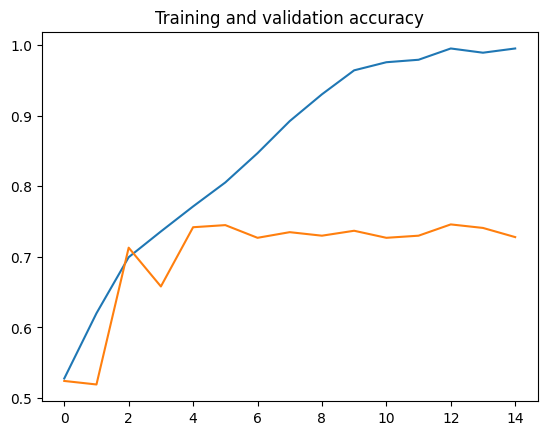

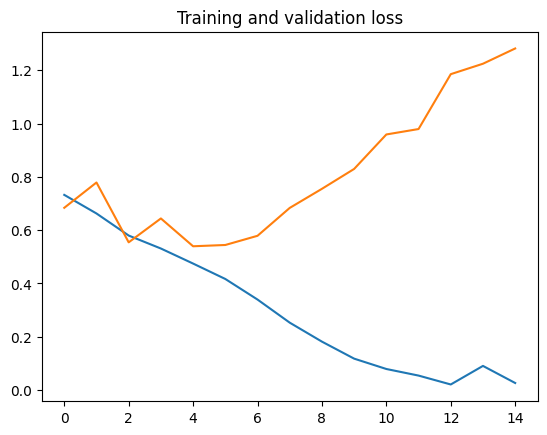

In [ ]:
acc      = history.history[     'accuracy' ]
val_acc  = history.history[ 'val_accuracy' ]
loss     = history.history[    'loss' ]
val_loss = history.history['val_loss' ]

epochs   = range(len(acc))

plt.plot  ( epochs,     acc )
plt.plot  ( epochs, val_acc )
plt.title ('Training and validation accuracy')
plt.figure()

plt.plot  ( epochs,     loss )
plt.plot  ( epochs, val_loss )
plt.title ('Training and validation loss'   )

## Week 2

### Lab 1

In [ ]:
# Download the dataset
!wget https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip

--2023-08-30 18:25:30--  https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.199.128, 74.125.195.128, 172.253.117.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.199.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip.2’

cats_and_dogs_filte 100%[===================>]  65.43M   171MB/s    in 0.4s    

2023-08-30 18:25:31 (171 MB/s) - ‘cats_and_dogs_filtered.zip.2’ saved [68606236/68606236]



In [ ]:
import os
import zipfile

zip_ref = zipfile.ZipFile("./cats_and_dogs_filtered.zip", 'r')
zip_ref.extractall("tmp/")
zip_ref.close()

base_dir = 'tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

In [ ]:

import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop

def create_model():
  '''Creates a CNN with 4 convolutional layers'''
  model = tf.keras.models.Sequential([
      tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),

      tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),

      tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),

      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ])

  model.compile(loss='binary_crossentropy',
                optimizer=RMSprop(learning_rate=1e-4),
                metrics=['accuracy'])

  return model

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
EPOCHS = 20

model = create_model()

history = model.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=EPOCHS,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

Epoch 1/20
100/100 - 9s - loss: 0.6923 - accuracy: 0.5240 - val_loss: 0.6819 - val_accuracy: 0.5100 - 9s/epoch - 94ms/step
Epoch 2/20
100/100 - 5s - loss: 0.6766 - accuracy: 0.5695 - val_loss: 0.7011 - val_accuracy: 0.5390 - 5s/epoch - 49ms/step
Epoch 3/20
100/100 - 5s - loss: 0.6605 - accuracy: 0.5970 - val_loss: 0.6417 - val_accuracy: 0.6520 - 5s/epoch - 54ms/step
Epoch 4/20
100/100 - 7s - loss: 0.6327 - accuracy: 0.6280 - val_loss: 0.6145 - val_accuracy: 0.6680 - 7s/epoch - 67ms/step
Epoch 5/20
100/100 - 5s - loss: 0.5889 - accuracy: 0.6880 - val_loss: 0.6050 - val_accuracy: 0.6840 - 5s/epoch - 52ms/step
Epoch 6/20
100/100 - 5s - loss: 0.5657 - accuracy: 0.7080 - val_loss: 0.5778 - val_accuracy: 0.6870 - 5s/epoch - 52ms/step
Epoch 7/20
100/100 - 7s - loss: 0.5420 - accuracy: 0.7165 - val_loss: 0.5732 - val_accuracy: 0.7070 - 7s/epoch - 71ms/step
Epoch 8/20
100/100 - 9s - loss: 0.5312 - accuracy: 0.7305 - val_loss: 0.6087 - val_accuracy: 0.6650 - 9s/epoch - 93ms/step
Epoch 9/20
100/1

In [ ]:
import matplotlib.pyplot as plt

def plot_loss_acc(history):
  '''Plots the training and validation loss and accuracy from a history object'''
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(acc))

  plt.plot(epochs, acc, 'bo', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')

  plt.figure()

  plt.plot(epochs, loss, 'bo', label='Training Loss')
  plt.plot(epochs, val_loss, 'b', label='Validation Loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

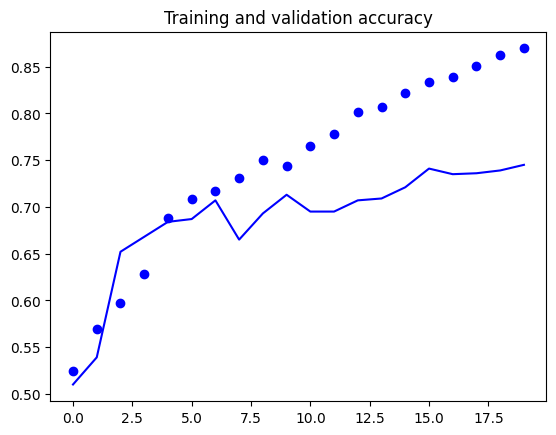

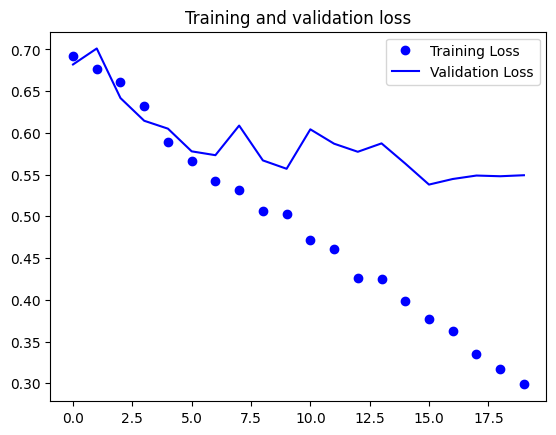

In [ ]:
plot_loss_acc(history)

In [ ]:
# Augmentation
model_for_aug = create_model()

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

history_with_aug = model_for_aug.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=EPOCHS,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/20
100/100 - 25s - loss: 0.6936 - accuracy: 0.5155 - val_loss: 0.6887 - val_accuracy: 0.6010 - 25s/epoch - 250ms/step
Epoch 2/20
100/100 - 18s - loss: 0.6896 - accuracy: 0.5460 - val_loss: 0.6744 - val_accuracy: 0.5790 - 18s/epoch - 180ms/step
Epoch 3/20
100/100 - 19s - loss: 0.6788 - accuracy: 0.5575 - val_loss: 0.6576 - val_accuracy: 0.6230 - 19s/epoch - 185ms/step
Epoch 4/20
100/100 - 26s - loss: 0.6735 - accuracy: 0.5620 - val_loss: 0.6531 - val_accuracy: 0.6010 - 26s/epoch - 259ms/step
Epoch 5/20
100/100 - 20s - loss: 0.6628 - accuracy: 0.5995 - val_loss: 0.6419 - val_accuracy: 0.6200 - 20s/epoch - 201ms/step
Epoch 6/20
100/100 - 21s - loss: 0.6580 - accuracy: 0.6045 - val_loss: 0.6239 - val_accuracy: 0.6510 - 21s/epoch - 205ms/step
Epoch 7/20
100/100 - 14s - loss: 0.6421 - accuracy: 0.6155 - val_loss: 0.6121 - val_accuracy: 0.6650 - 14s/epoch - 140ms/step
Epoch 8/20
100/100 - 14s - loss: 0

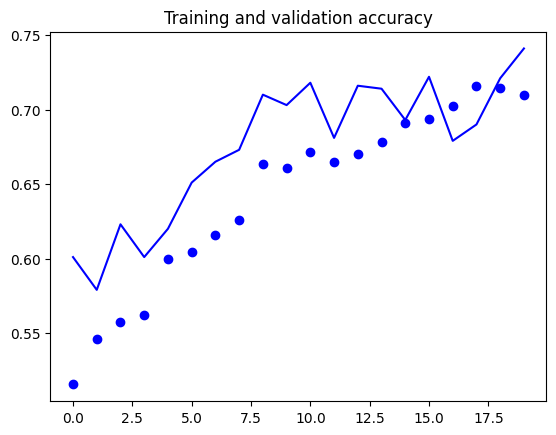

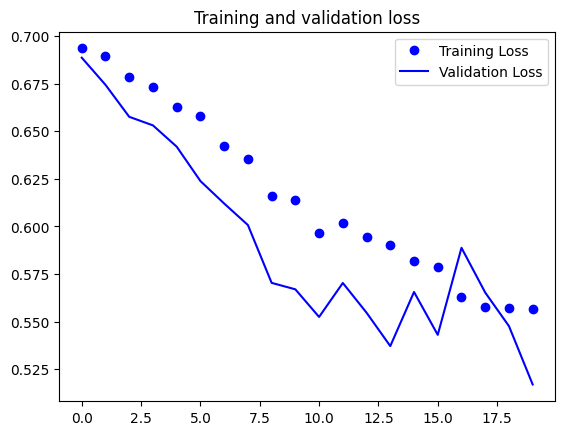

In [ ]:
plot_loss_acc(history_with_aug)

### Lab 2

In [ ]:
# Download the training set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

--2023-08-30 18:37:32--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.107.128, 74.125.20.128, 108.177.98.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.107.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘horse-or-human.zip.5’

horse-or-human.zip. 100%[===================>] 142.65M   192MB/s    in 0.7s    

2023-08-30 18:37:33 (192 MB/s) - ‘horse-or-human.zip.5’ saved [149574867/149574867]



In [ ]:
# Download the validation set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip

--2023-08-30 18:37:33--  https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.107.128, 74.125.20.128, 108.177.98.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.107.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11480187 (11M) [application/zip]
Saving to: ‘validation-horse-or-human.zip.3’

validation-horse-or 100%[===================>]  10.95M  --.-KB/s    in 0.06s   

2023-08-30 18:37:33 (185 MB/s) - ‘validation-horse-or-human.zip.3’ saved [11480187/11480187]



In [ ]:
import os
import zipfile

zip_ref = zipfile.ZipFile('./horse-or-human.zip', 'r')
zip_ref.extractall('tmp/horse-or-human')

zip_ref = zipfile.ZipFile('./validation-horse-or-human.zip', 'r')
zip_ref.extractall('tmp/validation-horse-or-human')

zip_ref.close()

train_horse_dir = os.path.join('tmp/horse-or-human/horses')
train_human_dir = os.path.join('tmp/horse-or-human/humans')
validation_horse_dir = os.path.join('tmp/validation-horse-or-human/horses')
validation_human_dir = os.path.join('tmp/validation-horse-or-human/humans')

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=1e-4),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
        'tmp/horse-or-human/',
        target_size=(300, 300),
        batch_size=128,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        'tmp/validation-horse-or-human/',
        target_size=(300, 300),
        batch_size=32,
        class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [ ]:
EPOCHS = 20

history = model.fit(
      train_generator,
      steps_per_epoch=8,
      epochs=EPOCHS,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8)

Epoch 1/20
8/8 [==============================] - 28s 3s/step - loss: 0.6897 - accuracy: 0.5017 - val_loss: 0.6768 - val_accuracy: 0.5234
Epoch 2/20
8/8 [==============================] - 24s 3s/step - loss: 0.6751 - accuracy: 0.6040 - val_loss: 0.6772 - val_accuracy: 0.5000
Epoch 3/20
8/8 [==============================] - 31s 4s/step - loss: 0.6705 - accuracy: 0.5895 - val_loss: 0.6907 - val_accuracy: 0.5000
Epoch 4/20
8/8 [==============================] - 39s 5s/step - loss: 0.6397 - accuracy: 0.6685 - val_loss: 0.7270 - val_accuracy: 0.5000
Epoch 5/20
8/8 [==============================] - 30s 4s/step - loss: 0.6250 - accuracy: 0.6596 - val_loss: 0.6715 - val_accuracy: 0.5078
Epoch 6/20
8/8 [==============================] - 24s 3s/step - loss: 0.6181 - accuracy: 0.6763 - val_loss: 0.7126 - val_accuracy: 0.5039
Epoch 7/20
8/8 [==============================] - 26s 3s/step - loss: 0.5871 - accuracy: 0.6924 - val_loss: 0.8150 - val_accuracy: 0.5000
Epoch 8/20
8/8 [==================

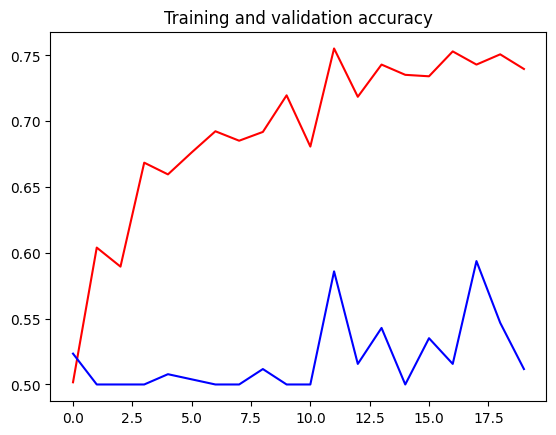

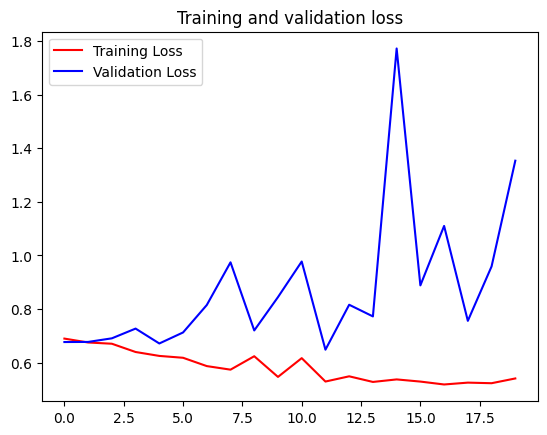

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## Week 3

### Lab 1

In [ ]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-08-30 18:50:09--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.195.128, 172.253.117.128, 142.250.99.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.195.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  68.0MB/s    in 1.2s    

2023-08-30 18:50:10 (68.0 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3),
                                include_top = False,
                                weights = None)

pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_24 (Conv2D)             (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d_24[0][0]']              
 alization)                                                                                       
                                                                                       

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7') # Last layer
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 768)


In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model

x = layers.Flatten()(last_output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(1, activation='sigmoid')(x)

model = Model(pre_trained_model.input, x)

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_24 (Conv2D)             (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d_24[0][0]']              
 alization)                                                                                       
                                                                                            

In [ ]:
model.compile(optimizer = RMSprop(learning_rate=0.0001),
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

In [ ]:
# Download the dataset
!wget https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip

--2023-08-30 18:50:16--  https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.195.128, 172.253.117.128, 142.250.99.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.195.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip.3’

cats_and_dogs_filte 100%[===================>]  65.43M   131MB/s    in 0.5s    

2023-08-30 18:50:16 (131 MB/s) - ‘cats_and_dogs_filtered.zip.3’ saved [68606236/68606236]



In [ ]:
import os
import zipfile
from tensorflow.keras.preprocessing.image import ImageDataGenerator

zip_ref = zipfile.ZipFile("./cats_and_dogs_filtered.zip", 'r')
zip_ref.extractall("tmp/")
zip_ref.close()

base_dir = 'tmp/cats_and_dogs_filtered'

train_dir = os.path.join( base_dir, 'train')
validation_dir = os.path.join( base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator( rescale = 1.0/255. )

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 20,
                                                    class_mode = 'binary',
                                                    target_size = (150, 150))

validation_generator =  test_datagen.flow_from_directory( validation_dir,
                                                          batch_size  = 20,
                                                          class_mode  = 'binary',
                                                          target_size = (150, 150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = 100,
            epochs = 20,
            validation_steps = 50,
            verbose = 2)

Epoch 1/20
100/100 - 23s - loss: 0.3035 - accuracy: 0.8720 - val_loss: 0.1146 - val_accuracy: 0.9580 - 23s/epoch - 233ms/step
Epoch 2/20
100/100 - 25s - loss: 0.2226 - accuracy: 0.9115 - val_loss: 0.0948 - val_accuracy: 0.9640 - 25s/epoch - 254ms/step
Epoch 3/20
100/100 - 16s - loss: 0.1849 - accuracy: 0.9270 - val_loss: 0.0982 - val_accuracy: 0.9660 - 16s/epoch - 155ms/step
Epoch 4/20
100/100 - 21s - loss: 0.1707 - accuracy: 0.9360 - val_loss: 0.1089 - val_accuracy: 0.9630 - 21s/epoch - 207ms/step
Epoch 5/20
100/100 - 16s - loss: 0.1637 - accuracy: 0.9360 - val_loss: 0.1728 - val_accuracy: 0.9480 - 16s/epoch - 159ms/step
Epoch 6/20
100/100 - 22s - loss: 0.1542 - accuracy: 0.9380 - val_loss: 0.1076 - val_accuracy: 0.9630 - 22s/epoch - 219ms/step
Epoch 7/20
100/100 - 16s - loss: 0.1527 - accuracy: 0.9465 - val_loss: 0.1143 - val_accuracy: 0.9640 - 16s/epoch - 163ms/step
Epoch 8/20
100/100 - 20s - loss: 0.1418 - accuracy: 0.9425 - val_loss: 0.0968 - val_accuracy: 0.9670 - 20s/epoch - 197

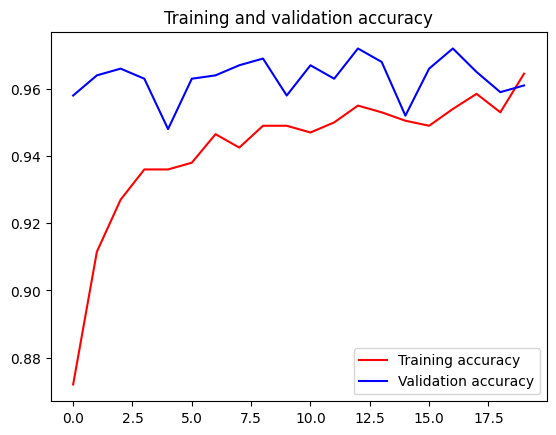

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

# Week 3 Assignment

In [ ]:
import os
import zipfile
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img

In [ ]:
!wget -q -P /content/ https://storage.googleapis.com/tensorflow-1-public/course2/week3/horse-or-human.zip

!wget -q -P /content/ https://storage.googleapis.com/tensorflow-1-public/course2/week3/validation-horse-or-human.zip

test_local_zip = './horse-or-human.zip'
zip_ref = zipfile.ZipFile(test_local_zip, 'r')
zip_ref.extractall('/tmp/training')

val_local_zip = './validation-horse-or-human.zip'
zip_ref = zipfile.ZipFile(val_local_zip, 'r')
zip_ref.extractall('/tmp/validation')

zip_ref.close()

In [ ]:
train_dir = '/tmp/training'
validation_dir = '/tmp/validation'

train_horses_dir = os.path.join(train_dir, 'horses')
train_humans_dir = os.path.join(train_dir, 'humans')
validation_horses_dir = os.path.join(validation_dir, 'horses')
validation_humans_dir = os.path.join(validation_dir, 'humans')

print(f"There are {len(os.listdir(train_horses_dir))} images of horses for training.\n")
print(f"There are {len(os.listdir(train_humans_dir))} images of humans for training.\n")
print(f"There are {len(os.listdir(validation_horses_dir))} images of horses for validation.\n")
print(f"There are {len(os.listdir(validation_humans_dir))} images of humans for validation.\n")

There are 500 images of horses for training.

There are 527 images of humans for training.

There are 128 images of horses for validation.

There are 128 images of humans for validation.



Sample horse image:


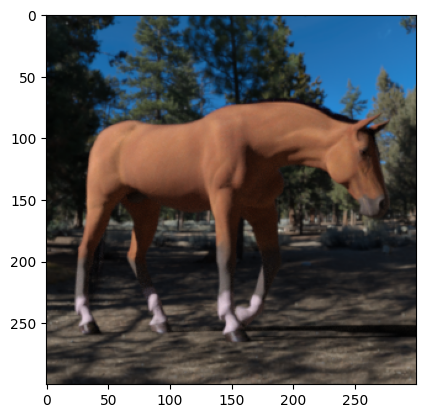


Sample human image:


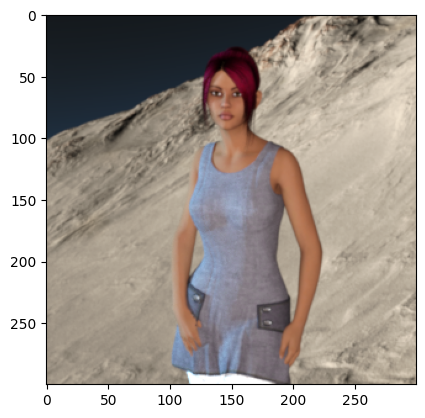

In [ ]:
print("Sample horse image:")
plt.imshow(load_img(f"{os.path.join(train_horses_dir, os.listdir(train_horses_dir)[0])}"))
plt.show()

print("\nSample human image:")
plt.imshow(load_img(f"{os.path.join(train_humans_dir, os.listdir(train_humans_dir)[0])}"))
plt.show()

In [ ]:
sample_image  = load_img(f"{os.path.join(train_horses_dir, os.listdir(train_horses_dir)[0])}")

sample_array = img_to_array(sample_image)

print(f"Each image has shape: {sample_array.shape}")

Each image has shape: (300, 300, 3)


In [ ]:
def train_val_generators(TRAINING_DIR, VALIDATION_DIR):
  """
  Creates the training and validation data generators

  Args:
    TRAINING_DIR (string): directory path containing the training images
    VALIDATION_DIR (string): directory path containing the testing/validation images

  Returns:
    train_generator, validation_generator: tuple containing the generators
  """
  train_datagen = ImageDataGenerator(rescale=1/255,
                                     rotation_range=40,
                                     width_shift_range=0.2,
                                     height_shift_range=0.2,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     horizontal_flip=True)

  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=32,
                                                      class_mode="binary",
                                                      target_size=(150, 150))

  validation_datagen = ImageDataGenerator(rescale=1/255)

  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=32,
                                                                class_mode="binary",
                                                                target_size=(150, 150))

  return train_generator, validation_generator

In [ ]:
train_generator, validation_generator = train_val_generators(train_dir, validation_dir)

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


In [ ]:
# Download the inception v3 weights
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-08-30 18:57:39--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.117.128, 142.250.99.128, 142.250.107.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.117.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   182MB/s    in 0.5s    

2023-08-30 18:57:40 (182 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [ ]:
def create_pre_trained_model(local_weights_file):
  """
  Initializes an InceptionV3 model.

  Args:
    local_weights_file (string): path pointing to a pretrained weights H5 file

  Returns:
    pre_trained_model: the initialized InceptionV3 model
  """
  pre_trained_model = InceptionV3(input_shape = (150, 150, 3),
                                  include_top = False,
                                  weights = None)

  pre_trained_model.load_weights(local_weights_file)

  for layer in pre_trained_model.layers:
    layer.trainable = False

  return pre_trained_model

In [ ]:
pre_trained_model = create_pre_trained_model(local_weights_file)

pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_118 (Conv2D)            (None, 74, 74, 32)   864         ['input_2[0][0]']                
                                                                                                  
 batch_normalization_94 (BatchN  (None, 74, 74, 32)  96          ['conv2d_118[0][0]']             
 ormalization)                                                                                    
                                                                                       

In [ ]:
total_params = pre_trained_model.count_params()
num_trainable_params = sum([w.shape.num_elements() for w in pre_trained_model.trainable_weights])

print(f"There are {total_params:,} total parameters in this model.")
print(f"There are {num_trainable_params:,} trainable parameters in this model.")

There are 21,802,784 total parameters in this model.
There are 0 trainable parameters in this model.


In [ ]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy') > 0.999):
      print("\nReached 99.9% accuracy so cancelling training!")
      self.model.stop_training = True

In [ ]:
def output_of_last_layer(pre_trained_model):
  """
  Gets the last layer output of a model

  Args:
    pre_trained_model (tf.keras Model): model to get the last layer output from

  Returns:
    last_output: output of the model's last layer
  """
  last_desired_layer = pre_trained_model.get_layer("mixed7")
  print('last layer output shape: ', last_desired_layer.output_shape)
  last_output = last_desired_layer.output
  print('last layer output: ', last_output)

  return last_output

In [ ]:
last_output = output_of_last_layer(pre_trained_model)

last layer output shape:  (None, 7, 7, 768)
last layer output:  KerasTensor(type_spec=TensorSpec(shape=(None, 7, 7, 768), dtype=tf.float32, name=None), name='mixed7/concat:0', description="created by layer 'mixed7'")


In [ ]:
print(f"The pretrained model has type: {type(pre_trained_model)}")

The pretrained model has type: <class 'keras.engine.functional.Functional'>


In [ ]:
def create_final_model(pre_trained_model, last_output):
  """
  Appends a custom model to a pre-trained model

  Args:
    pre_trained_model (tf.keras Model): model that will accept the train/test inputs
    last_output (tensor): last layer output of the pre-trained model

  Returns:
    model: the combined model
  """
  x = layers.Flatten()(last_output)

  x = layers.Dense(1024, activation="relu")(x)
  x = layers.Dropout(0.2)(x)
  x = layers.Dense(1, activation="sigmoid")(x)

  model = Model(inputs=pre_trained_model.input, outputs=x)

  model.compile(optimizer = RMSprop(learning_rate=0.0001),
                loss = "binary_crossentropy",
                metrics = ["accuracy"])

  return model

In [ ]:
model = create_final_model(pre_trained_model, last_output)

total_params = model.count_params()
num_trainable_params = sum([w.shape.num_elements() for w in model.trainable_weights])

print(f"There are {total_params:,} total parameters in this model.")
print(f"There are {num_trainable_params:,} trainable parameters in this model.")

There are 47,512,481 total parameters in this model.
There are 38,537,217 trainable parameters in this model.


In [ ]:
callbacks = myCallback()
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs = 100,
                    verbose = 2,
                    callbacks=callbacks)

Epoch 1/100
33/33 - 24s - loss: 0.2258 - accuracy: 0.9309 - val_loss: 0.0501 - val_accuracy: 0.9766 - 24s/epoch - 732ms/step
Epoch 2/100
33/33 - 16s - loss: 0.0392 - accuracy: 0.9854 - val_loss: 0.0152 - val_accuracy: 0.9961 - 16s/epoch - 494ms/step
Epoch 3/100
33/33 - 13s - loss: 0.0144 - accuracy: 0.9951 - val_loss: 0.0042 - val_accuracy: 1.0000 - 13s/epoch - 397ms/step
Epoch 4/100

Reached 99.9% accuracy so cancelling training!
33/33 - 11s - loss: 0.0085 - accuracy: 0.9990 - val_loss: 0.0130 - val_accuracy: 0.9922 - 11s/epoch - 339ms/step


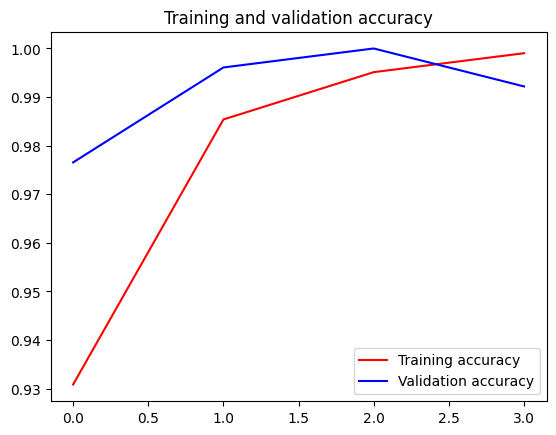

<Figure size 640x480 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

## Week 4

### Ungraded Lab

In [ ]:
# Download the train set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week4/rps.zip

# Download the test set
!wget https://storage.googleapis.com/tensorflow-1-public/course2/week4/rps-test-set.zip

--2023-08-30 18:59:04--  https://storage.googleapis.com/tensorflow-1-public/course2/week4/rps.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.203.128, 74.125.199.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.203.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 200682221 (191M) [application/zip]
Saving to: ‘rps.zip’

rps.zip             100%[===================>] 191.38M   121MB/s    in 1.6s    

2023-08-30 18:59:06 (121 MB/s) - ‘rps.zip’ saved [200682221/200682221]

--2023-08-30 18:59:06--  https://storage.googleapis.com/tensorflow-1-public/course2/week4/rps-test-set.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.203.128, 74.125.199.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.203.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29516758 (28M) [application/zip]
Saving to: ‘rps-test

In [ ]:
import zipfile

local_zip = './rps.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('tmp/rps-train')
zip_ref.close()

local_zip = './rps-test-set.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('tmp/rps-test')
zip_ref.close()

In [ ]:
import os

base_dir = 'tmp/rps-train/rps'

rock_dir = os.path.join(base_dir, 'rock')
paper_dir = os.path.join(base_dir, 'paper')
scissors_dir = os.path.join(base_dir, 'scissors')

print('total training rock images:', len(os.listdir(rock_dir)))
print('total training paper images:', len(os.listdir(paper_dir)))
print('total training scissors images:', len(os.listdir(scissors_dir)))

rock_files = os.listdir(rock_dir)
print(rock_files[:10])

paper_files = os.listdir(paper_dir)
print(paper_files[:10])

scissors_files = os.listdir(scissors_dir)
print(scissors_files[:10])

total training rock images: 840
total training paper images: 840
total training scissors images: 840
['rock01-090.png', 'rock03-089.png', 'rock04-094.png', 'rock05ck01-110.png', 'rock05ck01-081.png', 'rock04-021.png', 'rock03-107.png', 'rock02-047.png', 'rock01-064.png', 'rock04-068.png']
['paper06-062.png', 'paper01-000.png', 'paper04-036.png', 'paper02-059.png', 'paper02-034.png', 'paper03-073.png', 'paper07-050.png', 'paper06-103.png', 'paper05-062.png', 'paper05-026.png']
['testscissors02-059.png', 'scissors04-091.png', 'scissors02-007.png', 'scissors04-083.png', 'scissors01-044.png', 'testscissors03-064.png', 'testscissors01-029.png', 'testscissors03-083.png', 'testscissors02-044.png', 'testscissors02-047.png']


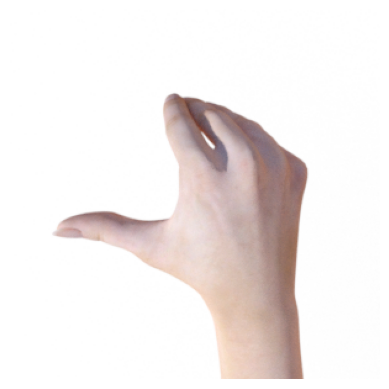

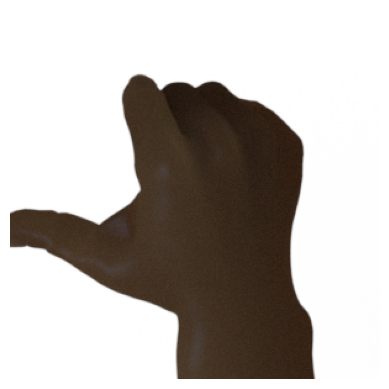

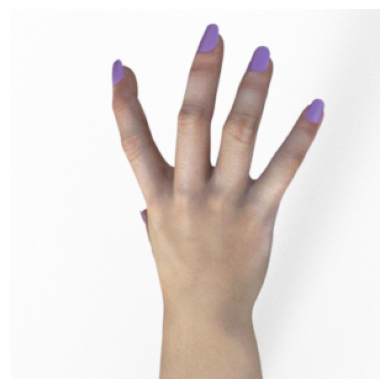

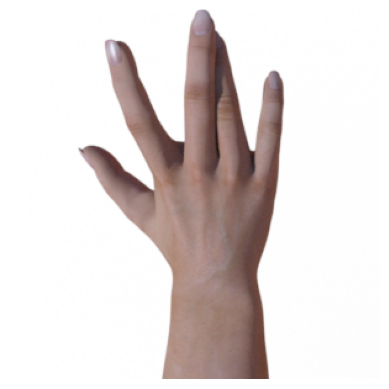

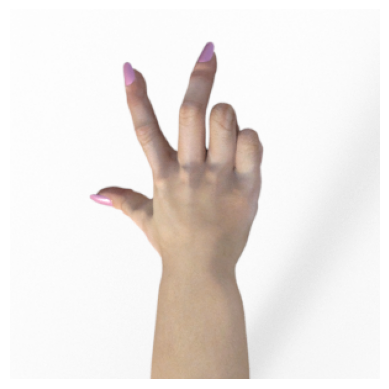

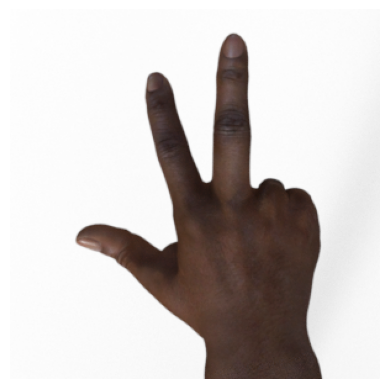

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic_index = 2

next_rock = [os.path.join(rock_dir, fname)
                for fname in rock_files[pic_index-2:pic_index]]
next_paper = [os.path.join(paper_dir, fname)
                for fname in paper_files[pic_index-2:pic_index]]
next_scissors = [os.path.join(scissors_dir, fname)
                for fname in scissors_files[pic_index-2:pic_index]]

for i, img_path in enumerate(next_rock+next_paper+next_scissors):
  img = mpimg.imread(img_path)
  plt.imshow(img)
  plt.axis('Off')
  plt.show()

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_212 (Conv2D)         (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 74, 74, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_213 (Conv2D)         (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_214 (Conv2D)         (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 17, 17, 128)     

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

TRAINING_DIR = "tmp/rps-train/rps"
training_datagen = ImageDataGenerator(
      rescale = 1./255,
	    rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

VALIDATION_DIR = "tmp/rps-test/rps-test-set"
validation_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = training_datagen.flow_from_directory(
	TRAINING_DIR,
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126
)

validation_generator = validation_datagen.flow_from_directory(
	VALIDATION_DIR,
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126
)

Found 2520 images belonging to 3 classes.
Found 372 images belonging to 3 classes.


In [ ]:
history = model.fit(train_generator, epochs=25, steps_per_epoch=20, validation_data = validation_generator, verbose=2)

Epoch 1/25
20/20 - 27s - loss: 1.1128 - accuracy: 0.3492 - val_loss: 1.0901 - val_accuracy: 0.3333 - 27s/epoch - 1s/step
Epoch 2/25
20/20 - 22s - loss: 1.0956 - accuracy: 0.3750 - val_loss: 1.0284 - val_accuracy: 0.5054 - 22s/epoch - 1s/step
Epoch 3/25
20/20 - 22s - loss: 1.0326 - accuracy: 0.4643 - val_loss: 0.9324 - val_accuracy: 0.7984 - 22s/epoch - 1s/step
Epoch 4/25
20/20 - 21s - loss: 0.9045 - accuracy: 0.5619 - val_loss: 0.6018 - val_accuracy: 0.6828 - 21s/epoch - 1s/step
Epoch 5/25
20/20 - 21s - loss: 0.7520 - accuracy: 0.6567 - val_loss: 0.3874 - val_accuracy: 0.7984 - 21s/epoch - 1s/step
Epoch 6/25
20/20 - 22s - loss: 0.6400 - accuracy: 0.6865 - val_loss: 0.2592 - val_accuracy: 0.9651 - 22s/epoch - 1s/step
Epoch 7/25
20/20 - 21s - loss: 0.6207 - accuracy: 0.7675 - val_loss: 0.1466 - val_accuracy: 0.9839 - 21s/epoch - 1s/step
Epoch 8/25
20/20 - 21s - loss: 0.4482 - accuracy: 0.7996 - val_loss: 0.3458 - val_accuracy: 0.9328 - 21s/epoch - 1s/step
Epoch 9/25
20/20 - 21s - loss: 0

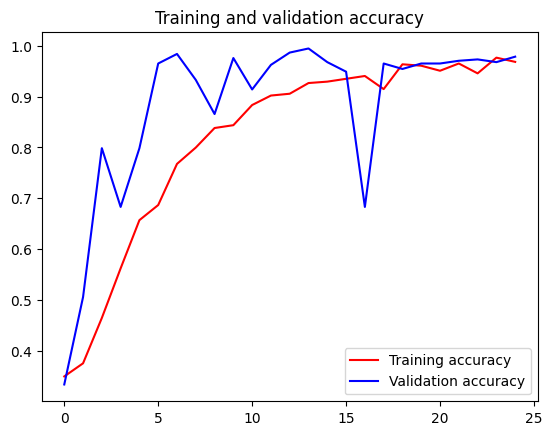

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():
  path = fn
  img = load_img(path, target_size=(150, 150))
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(fn)
  print(classes)

Saving download.png to download (3).png
1/1 [==============================] - 0s 247ms/step
download (3).png
[[1. 0. 0.]]


### Week 4 Assignment

In [ ]:
import csv
import string
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img

In [ ]:
!gdown --id 1z0DkA9BytlLxO1C0BAWzknLyQmZAp0HR
!gdown --id 1z1BIj4qmri59GWBG4ivMNFtpZ4AXIbzg

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1z0DkA9BytlLxO1C0BAWzknLyQmZAp0HR
To: /content/sign_mnist_train.csv
100% 83.3M/83.3M [00:00<00:00, 182MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1z1BIj4qmri59GWBG4ivMNFtpZ4AXIbzg
To: /content/sign_mnist_test.csv
100% 21.8M/21.8M [00:00<00:00, 115MB/s]


In [ ]:
TRAINING_FILE = './sign_mnist_train.csv'
VALIDATION_FILE = './sign_mnist_test.csv'

In [ ]:
with open(TRAINING_FILE) as training_file:
  line = training_file.readline()
  print(f"First line (header) looks like this:\n{line}")
  line = training_file.readline()
  print(f"Each subsequent line (data points) look like this:\n{line}")

First line (header) looks like this:
label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pix

In [ ]:
def parse_data_from_input(filename):
  """
  Parses the images and labels from a CSV file

  Args:
    filename (string): path to the CSV file

  Returns:
    images, labels: tuple of numpy arrays containing the images and labels
  """
  with open(filename) as file:
    csv_reader = csv.reader(file, delimiter=",")

    labels = []
    images = []

    iter = 0
    for row in csv_reader:
      iter += 1
      if iter == 1:
        continue
      else:
        labels.append(np.array(row[0]))
        images.append(np.array(row[1:]).reshape((28, 28)))

    labels = np.array(labels).astype(np.float64)
    images = np.array(images).astype(np.float64)

    return images, labels

In [ ]:
training_images, training_labels = parse_data_from_input(TRAINING_FILE)
validation_images, validation_labels = parse_data_from_input(VALIDATION_FILE)

print(f"Training images has shape: {training_images.shape} and dtype: {training_images.dtype}")
print(f"Training labels has shape: {training_labels.shape} and dtype: {training_labels.dtype}")
print(f"Validation images has shape: {validation_images.shape} and dtype: {validation_images.dtype}")
print(f"Validation labels has shape: {validation_labels.shape} and dtype: {validation_labels.dtype}")

Training images has shape: (27455, 28, 28) and dtype: float64
Training labels has shape: (27455,) and dtype: float64
Validation images has shape: (7172, 28, 28) and dtype: float64
Validation labels has shape: (7172,) and dtype: float64


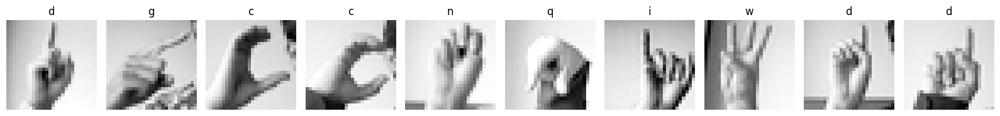

In [ ]:
def plot_categories(training_images, training_labels):
  fig, axes = plt.subplots(1, 10, figsize=(16, 15))
  axes = axes.flatten()
  letters = list(string.ascii_lowercase)

  for k in range(10):
    img = training_images[k]
    img = np.expand_dims(img, axis=-1)
    img = array_to_img(img)
    ax = axes[k]
    ax.imshow(img, cmap="Greys_r")
    ax.set_title(f"{letters[int(training_labels[k])]}")
    ax.set_axis_off()

  plt.tight_layout()
  plt.show()

plot_categories(training_images, training_labels)

In [ ]:
def train_val_generators(training_images, training_labels, validation_images, validation_labels):
  """
  Creates the training and validation data generators

  Args:
    training_images (array): parsed images from the train CSV file
    training_labels (array): parsed labels from the train CSV file
    validation_images (array): parsed images from the test CSV file
    validation_labels (array): parsed labels from the test CSV file

  Returns:
    train_generator, validation_generator - tuple containing the generators
  """
  training_images = np.expand_dims(training_images, axis=3)
  validation_images = np.expand_dims(validation_images, axis=3)
  train_datagen = ImageDataGenerator(rescale=1/255)

  train_generator = train_datagen.flow(x=training_images,
                                       y=training_labels,
                                       batch_size=32)

  validation_datagen = ImageDataGenerator(rescale=1/255)

  validation_generator = validation_datagen.flow(x=validation_images,
                                                 y=validation_labels,
                                                 batch_size=32)

  return train_generator, validation_generator

In [ ]:
train_generator, validation_generator = train_val_generators(training_images, training_labels, validation_images, validation_labels)

print(f"Images of training generator have shape: {train_generator.x.shape}")
print(f"Labels of training generator have shape: {train_generator.y.shape}")
print(f"Images of validation generator have shape: {validation_generator.x.shape}")
print(f"Labels of validation generator have shape: {validation_generator.y.shape}")

Images of training generator have shape: (27455, 28, 28, 1)
Labels of training generator have shape: (27455,)
Images of validation generator have shape: (7172, 28, 28, 1)
Labels of validation generator have shape: (7172,)


In [ ]:
def create_model():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(28, 28, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(150, activation="relu"),
    tf.keras.layers.Dense(26, activation="softmax")
  ])


  model.compile(optimizer = "adam",
                loss = "sparse_categorical_crossentropy",
                metrics=["accuracy"])

  return model

In [ ]:
model = create_model()

history = model.fit(train_generator,
                    epochs=15,
                    validation_data=validation_generator)

Epoch 1/15
858/858 [==============================] - 8s 7ms/step - loss: 0.9013 - accuracy: 0.7307 - val_loss: 0.4329 - val_accuracy: 0.8618
Epoch 2/15
858/858 [==============================] - 5s 6ms/step - loss: 0.0808 - accuracy: 0.9771 - val_loss: 0.4033 - val_accuracy: 0.8893
Epoch 3/15
858/858 [==============================] - 5s 6ms/step - loss: 0.0374 - accuracy: 0.9902 - val_loss: 0.3289 - val_accuracy: 0.9069
Epoch 4/15
858/858 [==============================] - 5s 6ms/step - loss: 0.0205 - accuracy: 0.9945 - val_loss: 0.3245 - val_accuracy: 0.8999
Epoch 5/15
858/858 [==============================] - 5s 5ms/step - loss: 0.0147 - accuracy: 0.9959 - val_loss: 0.4192 - val_accuracy: 0.9124
Epoch 6/15
858/858 [==============================] - 5s 6ms/step - loss: 0.0115 - accuracy: 0.9972 - val_loss: 0.3640 - val_accuracy: 0.9244
Epoch 7/15
858/858 [==============================] - 5s 6ms/step - loss: 0.0148 - accuracy: 0.9960 - val_loss: 0.3446 - val_accuracy: 0.9244
Epoch 

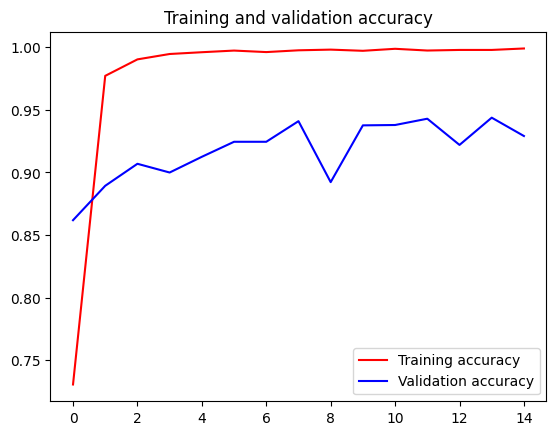

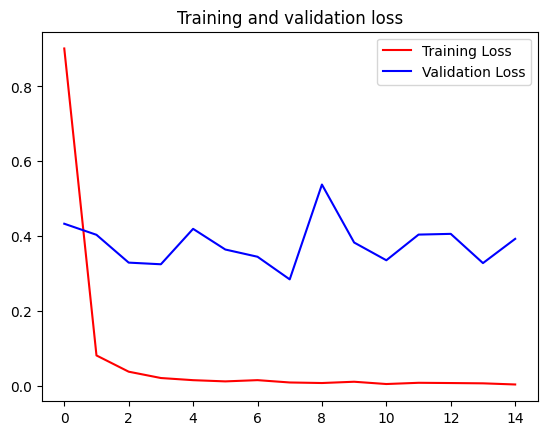

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()